<a href="https://colab.research.google.com/github/Yess1992/Segmentacion-Clientes-Kmeans/blob/main/TP1/Desarrollo_TFM_Yessenia_Medina.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <center>TFM: Segmentación de Clientes de un canal tradicional de una compañía cervecera en Lima, Perú usando K-Means (Ene-Jun 2022)<center>


---
# Resumen
---

Esta fase aborda las siguientes secciones:

1. Análisis Univariado: En el análisis Univariado se explorarán las características individuales de cada variable con el fin de comprender su comportamiento y distribución. Se identificarán tendencias centrales, dispersión y posibles valores atípicos, además de evaluar la presencia de datos nulos o inconsistencias.

2. Análisis Bivariado: En el análisis bivariado se estudiarán las relaciones entre pares de variables para identificar patrones, correlaciones y posibles asociaciones en los datos. Se explorará cómo una variable influye en otra y si existen dependencias significativas que puedan aportar información valiosa para la segmentación. Asimismo se explorarán relaciones entre variables mediante un análisis de características con la data transpuesta.Este análisis permitirá entender mejor la interacción entre las características de los clientes y determinar cuáles son más relevantes para la posterior aplicación del modelo de clustering.

3. Clustering: El proyecto avanza hacia la implementación del modelo con el objetivo de identificar agrupaciones en los datos de los clientes, empleando para ello el algoritmo K-Means. En esta etapa, se realiza un proceso detallado que incluye la determinación del número óptimo de clústeres. Además, se generan representaciones visuales, como gráficos de dispersión para facilitar la interpretación de los grupos obtenidos y caracterizar el comportamiento de cada segmento de clientes.

4. Validación: La validación del modelo se llevará a cabo evaluando múltiples características para garantizar la calidad de la segmentación. Primero, se realizará una evaluación interna para asegurar que los clústeres sean compactos, estén bien separados y mantengan coherencia dentro de cada grupo. Para determinar el número óptimo de clústeres y validar la segmentación, se emplearán métricas como el índice del codo y el coeficiente de silueta. Además, se complementará el análisis con representaciones visuales que permitan interpretar la distribución y separación de los clústeres de manera más intuitiva.

4. Interpretación de los resultados: Se procederá a la caracterización detallada de los clústeres generados por dicho modelo. Este análisis permitirá identificar las similitudes y diferencias entre los grupos, ofreciendo una visión detallada de las dinámicas y comportamientos dentro de estos clústeres, teniendo como apoyo visual mapas de calor.



---
# Inicialización
---

In [ ]:
# Imports generales
import pandas as pd

seed = 42  # Semilla aleatoria para reproducibilidad

# URL del archivo en GitHub
github_url = "https://raw.githubusercontent.com/Yess1992/Segmentacion-Clientes-Kmeans/refs/heads/main/BBDD_consumo.csv"

# Cargar el dataset desde GitHub
train = pd.read_csv(github_url)

In [ ]:
# Mostrar información del dataset
print(train.shape)
train.head()

(82438, 9)


,client_id,direccion,gerencia,nro_skus,vol_hl,nro_marcas,nro_meses_compra,nro_pedidos,valor_neto
0,10008054,PE Dir Lima,PE Ger P1 Lima Este,11,2.029,6,4,7,886.82
1,10165151,PE Dir Lima,PE Ger P1 Lima Oeste,10,4.972,5,6,10,2240.75
2,10165183,PE Dir Lima,PE Ger P1 Lima Este,6,8.349,4,5,11,3249.84
3,10165215,PE Dir Lima,PE Ger P1 Lima Este,37,43.334,16,6,34,19361.11
4,10165216,PE Dir Lima,PE Ger P1 Lima Este,28,29.607,12,6,17,13235.19


---
# Análisis Univariado
---

**Dimensión**


El dataset train consta de 82,438 registros y 9 variables

In [ ]:
train.shape

(82438, 9)

**Detección de tipos de datos**

- Variables Cuantitativas (5):
nro_skus,	vol_hl,	nro_marcas,	nro_meses_compra,	nro_pedidos, valor_neto

- Variables Cualitativas (1): gerencia

In [ ]:
train.dtypes

,0
client_id,int64
direccion,object
gerencia,object
nro_skus,int64
vol_hl,float64
nro_marcas,int64
nro_meses_compra,int64
nro_pedidos,int64
valor_neto,float64


Eliminamos la variable client_id	, direccion y gerencia , por ser un identificador del cliente, la dirección solo incluye a Lima, el cual es el centro de estudio y gerencia por ser una variable cualitativa.

In [ ]:
train.drop("client_id", axis = 1, inplace = True)

In [ ]:
train.drop("direccion", axis = 1, inplace = True)

In [ ]:
train.drop("gerencia", axis = 1, inplace = True)

**Creación de nuevas características**

Para crear nuevas características a partir de las existentes, es útil centrarse en la naturaleza de los datos y las relaciones que podrían influir en la segmentación de clústeres. Se crearon las siguientes variables con la finalidad que puedan ayudar a analizar el comportamiento de compra de los clientes

**1. Volumen promedio por pedido**

Esta métrica indica el promedio de volumen comprado por cada pedido. Te dice, en términos simples, cuántos hectolitros (Hl) de producto, en promedio, se compran cada vez que se hace un pedido.

**2. Volumen promedio por marca**

Indica cuánto volumen de compra (en Hl) en promedio corresponde a cada marca comprada. En otras palabras, te dice cuántos hectolitros (Hl) de producto, en promedio, se compran por cada marca adquirida.

**3. Pedidos promedio por marca**

Nos dice cuántos pedidos en promedio se realizan por cada marca comprada. Permite entender si un cliente tiende a comprar varias veces la misma marca o si diversifica sus compras entre distintas marcas.

**4. SKUs promedio por pedido**

Muestra cuántos productos diferentes (SKUs) se compran en promedio por pedido. Es útil para analizar si un cliente compra mucha o poca variedad en cada compra.

**5. SKUs promedio por marca**

Indica cuántos productos diferentes (SKUs) en promedio se compran por cada marca. Ayuda a entender si un cliente compra una amplia variedad dentro de cada marca o si se enfoca en pocos productos específicos.

**6. Densidad de compra**

Indica el volumen de compra (Hl) en promedio por cada mes en que se realizaron compras. Permite identificar la intensidad con la que un cliente consume el producto en función del tiempo.

**7. Frecuencia de pedidos**

Nos dice cada cuántos meses, en promedio, se realiza un pedido. Permite conocer si un cliente compra con frecuencia o si sus compras son más esporádicas.

**8. Porcentaje de SKUs por marca**

Indica qué tan diversificada está la compra en términos de productos por marca. Permite evaluar qué tan diversificada es la compra dentro de cada marca.

**9. Volumen por SKU**

Mide cuántos Hl de compra corresponden, en promedio, a cada SKU adquirido. Ayuda a analizar qué tan grandes son las compras en función del número de productos distintos.




Para identificar a todas estas nuevas características, llevarán el prefijo calc_(de calculadas)

In [ ]:
import numpy as np

train["calc_volumen_promedio_pedido"] = train["vol_hl"] / train["nro_pedidos"].replace(0, np.nan)
train["calc_volumen_promedio_marca"] = train["vol_hl"] / train["nro_marcas"].replace(0, np.nan)
train["calc_pedidos_promedio_marca"] = train["nro_pedidos"] / train["nro_marcas"].replace(0, np.nan)
train["calc_skus_promedio_pedido"] = train["nro_skus"] / train["nro_pedidos"].replace(0, np.nan)
train["calc_skus_promedio_marca"] = train["nro_skus"] / train["nro_marcas"].replace(0, np.nan)
train["calc_densidad_compra"] = train["vol_hl"] / train["nro_meses_compra"].replace(0, np.nan)
train["calc_frecuencia_pedidos"] = train["nro_meses_compra"] / train["nro_pedidos"].replace(0, np.nan)
train["calc_porcentaje_skus_marca"] = train["nro_skus"] / train["nro_marcas"].replace(0, np.nan)
train["calc_volumen_por_sku"] = train["vol_hl"] / train["nro_skus"].replace(0, np.nan)

In [ ]:
train.tail(5)

,nro_skus,vol_hl,nro_marcas,nro_meses_compra,nro_pedidos,valor_neto,calc_volumen_promedio_pedido,calc_volumen_promedio_marca,calc_pedidos_promedio_marca,calc_skus_promedio_pedido,calc_skus_promedio_marca,calc_densidad_compra,calc_frecuencia_pedidos,calc_porcentaje_skus_marca,calc_volumen_por_sku
82433,8,4.001,6,1,1,1531.85,4.001,0.666833,0.166667,8.0,1.333333,4.001,1.0,1.333333,0.500125
82434,14,0.990,5,1,1,514.62,0.990,0.198000,0.200000,14.0,2.800000,0.990,1.0,2.800000,0.070714
82435,5,0.080,3,1,1,53.29,0.080,0.026667,0.333333,5.0,1.666667,0.080,1.0,1.666667,0.016000
82436,6,2.683,4,1,1,1127.45,2.683,0.670750,0.250000,6.0,1.500000,2.683,1.0,1.500000,0.447167
82437,8,0.662,5,1,1,352.57,0.662,0.132400,0.200000,8.0,1.600000,0.662,1.0,1.600000,0.082750


**Análisis Exploratorio de Datos (EDA)**

*Resumen Estadístico*

In [ ]:
train.describe().round(2)

,nro_skus,vol_hl,nro_marcas,nro_meses_compra,nro_pedidos,valor_neto,calc_volumen_promedio_pedido,calc_volumen_promedio_marca,calc_pedidos_promedio_marca,calc_skus_promedio_pedido,calc_skus_promedio_marca,calc_densidad_compra,calc_frecuencia_pedidos,calc_porcentaje_skus_marca,calc_volumen_por_sku
count,82438.00,82438.00,82438.00,82438.00,82438.00,82433.00,82438.00,82438.00,82438.00,82438.00,82438.00,82438.00,82438.00,82438.00,82438.00
mean,10.92,11.82,6.01,4.70,14.67,5120.85,0.63,1.73,2.57,1.04,1.76,2.18,0.49,1.76,0.97
std,7.80,39.40,3.66,1.67,11.98,15811.92,0.75,3.33,1.83,1.00,0.50,6.74,0.26,0.50,1.75
min,1.00,-35.81,1.00,1.00,1.00,-22204.50,-5.97,-17.90,0.07,0.04,1.00,-11.94,0.02,1.00,-5.97
25%,5.00,1.97,3.00,4.00,6.00,858.79,0.30,0.49,1.33,0.53,1.43,0.54,0.27,1.43,0.30
50%,9.00,5.76,5.00,6.00,12.00,2504.23,0.48,1.09,2.18,0.80,1.75,1.16,0.43,1.75,0.63
75%,15.00,13.28,8.00,6.00,21.00,5828.15,0.75,2.07,3.31,1.19,2.00,2.38,0.67,2.00,1.16
max,67.00,5964.27,29.00,6.00,400.00,2216868.79,45.36,298.21,38.00,32.00,7.00,994.05,1.00,7.00,135.55


Encontramos valores negativos para las variables vol_hl y valor_neto. Esto corresponde a las devoluciones que realiza el cliente.

Vamos a ver cuanto representan las devoluciones de la variable vol_hl y valor_neto con respecto al total.

In [ ]:
(train['vol_hl'].lt(0).sum() / len(train)).round(4)

0.0

In [ ]:
train['valor_neto'].lt(0).sum() / len(train)

0.004087920619131954

Vemos que las devoluciones no involucran un valor representativo con respecto al total, por lo que procedemos a retirarlos de la base.

In [ ]:
train = train.loc[(train['valor_neto'].isna()) | (train['valor_neto'] >= 0)]

In [ ]:
train.describe().round(2)

,nro_skus,vol_hl,nro_marcas,nro_meses_compra,nro_pedidos,valor_neto,calc_volumen_promedio_pedido,calc_volumen_promedio_marca,calc_pedidos_promedio_marca,calc_skus_promedio_pedido,calc_skus_promedio_marca,calc_densidad_compra,calc_frecuencia_pedidos,calc_porcentaje_skus_marca,calc_volumen_por_sku
count,82101.00,82101.00,82101.00,82101.00,82101.00,82096.00,82101.00,82101.00,82101.00,82101.00,82101.00,82101.00,82101.00,82101.00,82101.00
mean,10.96,11.87,6.03,4.71,14.72,5142.74,0.63,1.73,2.58,1.04,1.76,2.19,0.49,1.76,0.97
std,7.79,39.47,3.66,1.66,11.98,15840.38,0.75,3.34,1.83,1.00,0.49,6.76,0.26,0.49,1.75
min,1.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,0.07,0.04,1.00,0.00,0.02,1.00,0.00
25%,5.00,2.01,3.00,4.00,6.00,875.56,0.30,0.49,1.33,0.53,1.43,0.54,0.27,1.43,0.30
50%,9.00,5.80,5.00,6.00,12.00,2520.45,0.48,1.10,2.20,0.80,1.75,1.16,0.43,1.75,0.64
75%,15.00,13.32,8.00,6.00,21.00,5848.48,0.76,2.08,3.33,1.19,2.00,2.39,0.67,2.00,1.16
max,67.00,5964.27,29.00,6.00,400.00,2216868.79,45.36,298.21,38.00,32.00,7.00,994.05,1.00,7.00,135.55


El conjunto de datos de la cervecera consta de 82,101 registros y proporciona detalles sobre las compras de productos y el comportamiento de los clientes en términos de volumen, marcas y frecuencia de pedidos.

El número de SKUs presenta una notable variabilidad, con un promedio de 10.96 y valores que oscilan entre 1 y 67, lo que indica una amplia gama de productos adquiridos por los consumidores. El volumen de compra en hectolitros (Hl) tiene una media de 11.87 Hl, con registros que llegan hasta 5,964.27 Hl, lo que sugiere que algunos clientes tienen una demanda mucho mayor que otros.

El número de marcas adquiridas por cliente tiene un promedio de 6.03, con una dispersión significativa que alcanza hasta 29 marcas, lo que podría reflejar la diversidad en la oferta de cervezas y la presencia de múltiples marcas en el mercado.

El número de pedidos muestra una alta variabilidad, con una media de 14.72 pedidos por cliente y valores que van desde 1 hasta 400 pedidos. Esto denota patrones de compra distintos, posiblemente influenciados por factores como la frecuencia de consumo, promociones o la estacionalidad de la demanda.

Las métricas calculadas ofrecen una visión más profunda de los patrones de compra. El volumen promedio por pedido es de 0.63 Hl, mientras que el volumen promedio por marca asciende a 1.73 Hl, mostrando una gran dispersión en la cantidad de producto adquirido por transacción. Asimismo, la densidad de compra se sitúa en 2.19 Hl/mes y la frecuencia de pedidos en 0.49 pedidos/mes, lo que refleja diferencias notables en los hábitos de compra de los clientes.

El volumen por SKU tiene una media de 0.97 Hl, pero con valores extremos que alcanzan 135.55 Hl, lo que indica que ciertos productos son altamente demandados en comparación con otros. Además, el porcentaje de SKUs por marca, con una media de 1.76, sugiere que la variedad de productos adquiridos dentro de cada marca varía significativamente según el cliente.

Estos hallazgos proporcionan información clave para realizar segmentaciones, ya que las diferencias en el comportamiento de compra pueden ser aprovechadas para diseñar estrategias personalizadas de marketing y distribución.

**Valores Nulos**

Se observa que existe la presencia de 5 registros con valores nulos para la variable valor_neto.

In [ ]:
train.isnull().sum()

,0
nro_skus,0
vol_hl,0
nro_marcas,0
nro_meses_compra,0
nro_pedidos,0
valor_neto,5
calc_volumen_promedio_pedido,0
calc_volumen_promedio_marca,0
calc_pedidos_promedio_marca,0
calc_skus_promedio_pedido,0


Aunque valor_neto está ausente, otras variables como vol_hl, nro_pedidos y nro_skus contienen información relevante. Esto nos sugiere que aún es posible imputar un valor razonable por criterio de negocio en lugar de descartar los datos.

In [ ]:
train[train["valor_neto"].isnull()].describe()

,nro_skus,vol_hl,nro_marcas,nro_meses_compra,nro_pedidos,valor_neto,calc_volumen_promedio_pedido,calc_volumen_promedio_marca,calc_pedidos_promedio_marca,calc_skus_promedio_pedido,calc_skus_promedio_marca,calc_densidad_compra,calc_frecuencia_pedidos,calc_porcentaje_skus_marca,calc_volumen_por_sku
count,5.000000,5.000000,5.000000,5.000000,5.000000,0.0,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000
mean,31.600000,418.345600,13.400000,5.200000,86.800000,NaN,5.971886,32.378482,6.565186,1.436048,2.237847,72.657067,0.189139,2.237847,15.490692
std,20.403431,552.925029,5.813777,1.788854,68.928949,NaN,5.458903,38.842138,5.312652,2.214773,0.415024,89.877349,0.268692,0.415024,18.260821
min,16.000000,43.308000,8.000000,2.000000,3.000000,NaN,0.734034,1.882957,0.375000,0.166667,1.833333,7.218000,0.033520,1.833333,0.646388
25%,22.000000,43.992000,10.000000,6.000000,59.000000,NaN,3.088053,5.499000,2.565217,0.167598,2.000000,21.996000,0.045455,2.000000,2.749500
50%,23.000000,226.953000,12.000000,6.000000,61.000000,NaN,3.720541,22.695300,6.100000,0.377049,2.142857,37.825500,0.098361,2.142857,9.867522
75%,30.000000,407.623000,14.000000,6.000000,132.000000,NaN,7.652804,33.968583,11.000000,1.135593,2.300000,67.937167,0.101695,2.300000,18.528318
max,67.000000,1369.852000,23.000000,6.000000,179.000000,NaN,14.664000,97.846571,12.785714,5.333333,2.913043,228.308667,0.666667,2.913043,45.661733


**Imputación de Valores nulos**

Como el valor_neto está relacionado con vol_hl y el número de pedidos estimamos los valores faltantes de la siguiente manera:

In [ ]:
train["valor_neto"] = train["valor_neto"].fillna(train["vol_hl"] / train["nro_pedidos"])

In [ ]:
train.describe().round(2)

,nro_skus,vol_hl,nro_marcas,nro_meses_compra,nro_pedidos,valor_neto,calc_volumen_promedio_pedido,calc_volumen_promedio_marca,calc_pedidos_promedio_marca,calc_skus_promedio_pedido,calc_skus_promedio_marca,calc_densidad_compra,calc_frecuencia_pedidos,calc_porcentaje_skus_marca,calc_volumen_por_sku
count,82101.00,82101.00,82101.00,82101.00,82101.00,82101.00,82101.00,82101.00,82101.00,82101.00,82101.00,82101.00,82101.00,82101.00,82101.00
mean,10.96,11.87,6.03,4.71,14.72,5142.43,0.63,1.73,2.58,1.04,1.76,2.19,0.49,1.76,0.97
std,7.79,39.47,3.66,1.66,11.98,15839.95,0.75,3.34,1.83,1.00,0.49,6.76,0.26,0.49,1.75
min,1.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,0.07,0.04,1.00,0.00,0.02,1.00,0.00
25%,5.00,2.01,3.00,4.00,6.00,875.47,0.30,0.49,1.33,0.53,1.43,0.54,0.27,1.43,0.30
50%,9.00,5.80,5.00,6.00,12.00,2519.95,0.48,1.10,2.20,0.80,1.75,1.16,0.43,1.75,0.64
75%,15.00,13.32,8.00,6.00,21.00,5848.38,0.76,2.08,3.33,1.19,2.00,2.39,0.67,2.00,1.16
max,67.00,5964.27,29.00,6.00,400.00,2216868.79,45.36,298.21,38.00,32.00,7.00,994.05,1.00,7.00,135.55


Ahora veamos luego de ejecutar la imputación de valores nulos, que todas las características cuentan con información.

In [ ]:
train.isnull().sum()

,0
nro_skus,0
vol_hl,0
nro_marcas,0
nro_meses_compra,0
nro_pedidos,0
valor_neto,0
calc_volumen_promedio_pedido,0
calc_volumen_promedio_marca,0
calc_pedidos_promedio_marca,0
calc_skus_promedio_pedido,0


Ya no contamos con valores nulos.

**Identificación de Valores duplicados**

Observamos que existen valores duplicados, los cuales representan el 3.23% con respecto a la población total.

In [ ]:
train[train.duplicated(keep=False)]

,nro_skus,vol_hl,nro_marcas,nro_meses_compra,nro_pedidos,valor_neto,calc_volumen_promedio_pedido,calc_volumen_promedio_marca,calc_pedidos_promedio_marca,calc_skus_promedio_pedido,calc_skus_promedio_marca,calc_densidad_compra,calc_frecuencia_pedidos,calc_porcentaje_skus_marca,calc_volumen_por_sku
204,2,0.049,1,2,2,25.49,0.0245,0.04900,2.000000,1.0,2.000000,0.0245,1.0,2.000000,0.024500
541,2,0.049,2,1,1,26.10,0.0490,0.02450,0.500000,2.0,1.000000,0.0490,1.0,1.000000,0.024500
634,1,0.151,1,1,1,60.56,0.1510,0.15100,1.000000,1.0,1.000000,0.1510,1.0,1.000000,0.151000
658,1,0.020,1,1,1,10.29,0.0200,0.02000,1.000000,1.0,1.000000,0.0200,1.0,1.000000,0.020000
732,1,0.568,1,1,1,245.68,0.5680,0.56800,1.000000,1.0,1.000000,0.5680,1.0,1.000000,0.568000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82322,1,0.021,1,1,1,23.76,0.0210,0.02100,1.000000,1.0,1.000000,0.0210,1.0,1.000000,0.021000
82348,2,0.074,2,1,1,34.56,0.0740,0.03700,0.500000,2.0,1.000000,0.0740,1.0,1.000000,0.037000
82366,7,0.227,4,1,1,92.12,0.2270,0.05675,0.250000,7.0,1.750000,0.2270,1.0,1.750000,0.032429
82384,4,0.378,3,1,1,153.53,0.3780,0.12600,0.333333,4.0,1.333333,0.3780,1.0,1.333333,0.094500


In [ ]:
print(f"Número de duplicados: {train.duplicated(keep=False).sum()}, Porcentaje: {(train.duplicated(keep=False).mean() * 100):.2f}%")

Número de duplicados: 2654, Porcentaje: 3.23%


Procedemos a eliminarlos. Una columna cuyos valores sean siempre los mismos, no suele aportar nada al modelo. Este es un problema típico en características categóricas.

In [ ]:
train = train.drop_duplicates()
print(train.shape)

(79933, 15)


**Distribución de datos**

Se realizaron Histogramas para ver la distribución de los datos.
Se observa lo siguiente por cada variable que se está analizando:

- **nro_skus**: Presenta una distribución asimétrica positiva (sesgada a la derecha), con la mayoría de los clientes comprando menos de 10 SKUs. Sin embargo, hay valores más altos que sugieren que algunos clientes adquieren una gran variedad de productos.

- **vol_hl**: Presenta una fuerte asimetría a la derecha, indicando que la mayoría de los registros tienen volúmenes bajos, pero algunos pocos alcanzan valores muy altos, lo que indica que hay clientes con un consumo considerablemente superior al promedio.

- **nro_marcas**:Distribución asimétrica positiva, con la mayoría de los clientes comprando menos de 10 marcas. Sin embargo, hay casos en los que un cliente puede comprar hasta 29 marcas diferentes, lo que refleja una preferencia por la variedad.

- **nro_meses_compra**: Presenta una distribución multimodal, con picos en los valores 1 y 6. Esto sugiere que hay clientes que compran muy ocasionalmente y otros que compran de manera recurrente cada mes.

- **nro_pedidos**:  Se observa un patrón donde la mayoría de los clientes realizan pocos pedidos, pero algunos alcanzan hasta 400, lo que indica la presencia de compradores recurrentes con una alta frecuencia de compra.

- **valor_neto**: Similar a nro_pedidos, la mayoría de los clientes tienen un valor neto bajo en compras, con unos pocos alcanzando montos elevados.

- **calc_volumen_promedio_pedido**: Presenta una distribución altamente sesgada, con la mayoría de los valores concentrados en cifras bajas, lo que sugiere que la mayoría de los pedidos son de bajo volumen.

- **calc_volumen_promedio_marca**: Tiene un comportamiento similar al volumen promedio por pedido, con la mayoría de los valores bajos, pero algunos casos extremos en los que ciertos clientes adquieren grandes cantidades por marca.

- **calc_pedidos_promedio_marca**: La mayoría de los clientes realizan pocos pedidos por marca, con una larga cola hacia valores más altos. Esto sugiere que hay un pequeño grupo de clientes con una alta lealtad a ciertas marcas.

- **calc_skus_promedio_pedido**:Distribución asimétrica positiva, donde la mayoría de los pedidos contienen pocos SKUs, pero existen algunos casos en los que los pedidos incluyen más de 10 SKUs, indicando una mayor diversidad de productos comprados.

- **calc_skus_promedio_marca:**: Se observa que la mayoría de las marcas tienen en promedio entre 1 y 3 SKUs comprados, con pocos casos en los que la diversidad de SKUs por marca es considerablemente mayor.

- **calc_densidad_compra**: Se presenta una fuerte asimetría positiva, con la mayoría de los clientes con densidades de compra bajas, pero con algunos casos donde el nivel de compras es significativamente mayor.

- **calc_frecuencia_pedidos**: Distribución multimodal, con picos en diferentes niveles de frecuencia de pedidos. Esto indica que hay distintos grupos de clientes con patrones de compra diferenciados.

- **calc_porcentaje_skus_marca**: La mayoría de los registros tienen un bajo porcentaje de SKUs comprados por marca, aunque hay algunos clientes que adquieren una mayor proporción de SKUs dentro de una misma marca.

- **calc_volumen_por_sku**: La distribución muestra que la mayoría de los registros presentan volúmenes bajos por SKU, con algunos casos extremos donde los clientes adquieren grandes volúmenes de un solo SKU.



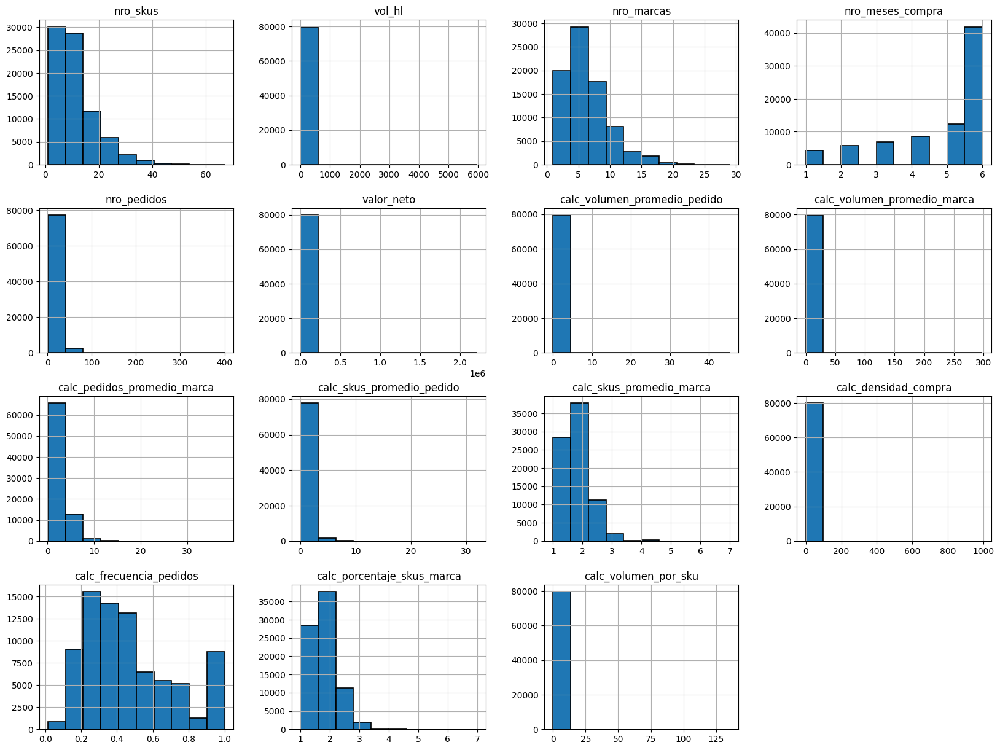

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore")

#train_columns_except.hist(edgecolor='black', linewidth=1.2)
train.hist(edgecolor='black', linewidth=1.2)
fig=plt.gcf()
fig.set_size_inches(20,15)

*Fuente del código: Apoyo ChatGPT.*

**Análisis y Tratamiento de Outliers**

**Análisis de la simetría**


Para estudiar la simetría de estas variables más allá de lo visual, se va a usar el sesgo (skewness) como indicador estadístico (también conocido como tercer momento. Este sesgo mide la asimetría de la distribución.

Para evaluar el sesgo numéricamente y saber si la distribución es asimétrica o no, seguiremos las siguientes categorizaciones (datacamp):

(-0.5, 0.5): bajo sesgo o aproximadamente simétrica.

(-1, -0.5) U (0.5, 1): moderadamente sesgada

(-inf, -1) U (1, inf): altamente sesgada

Además, se aprovechará este cálculo para el resto de características y su cumplimentación por la media o la mediana.

In [ ]:
from scipy import stats
sesgos = {} #En este diccionario se almacenarán los sesgos por característica
tipos_sesgos = ('Bajo sesgo o aproximadamente simétrica',
                'Moderadamente sesgada',
                'Altamente sesgada')
for col in train.columns:
  sesgo = stats.skew(train[col], nan_policy = 'omit')
  if -0.5 < sesgo < 0.5:
        tipo = tipos_sesgos[0]
  elif -1 < sesgo <= -0.5 or 0.5 <= sesgo < 1:
      tipo = tipos_sesgos[1]
  elif sesgo <= -1 or sesgo >= 1:
      tipo = tipos_sesgos[2]

  sesgos[col] = tipo
  print(f"Característica: {col}; Sesgo: {round(sesgo, 2)}, {tipo}")

#Referencia: https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.skew.html

Característica: nro_skus; Sesgo: 1.39, Altamente sesgada
Característica: vol_hl; Sesgo: 61.11, Altamente sesgada
Característica: nro_marcas; Sesgo: 1.06, Altamente sesgada
Característica: nro_meses_compra; Sesgo: -1.12, Altamente sesgada
Característica: nro_pedidos; Sesgo: 2.54, Altamente sesgada
Característica: valor_neto; Sesgo: 54.33, Altamente sesgada
Característica: calc_volumen_promedio_pedido; Sesgo: 15.03, Altamente sesgada
Característica: calc_volumen_promedio_marca; Sesgo: 27.35, Altamente sesgada
Característica: calc_pedidos_promedio_marca; Sesgo: 2.73, Altamente sesgada
Característica: calc_skus_promedio_pedido; Sesgo: 6.22, Altamente sesgada
Característica: calc_skus_promedio_marca; Sesgo: 0.88, Moderadamente sesgada
Característica: calc_densidad_compra; Sesgo: 57.45, Altamente sesgada
Característica: calc_frecuencia_pedidos; Sesgo: 0.76, Moderadamente sesgada
Característica: calc_porcentaje_skus_marca; Sesgo: 0.88, Moderadamente sesgada
Característica: calc_volumen_por_sk

La mayoría de algoritmos de ML, son sensibles a estos sesgos, por lo que es conveniente visualizar los outliers y, en caso de que tenga sentido, tratarlos.

Se crea un generador para incrementar las veces que hagan falta dos coordenadas que servirán para graficar n veces boxplot en función del criterio mencionado.

In [ ]:
def increment_index(k):
  for i in range (k):
    for j in range (k):
      yield i, j

#Referencia: https://ellibrodepython.com/yield-python

In [ ]:
import math
import matplotlib.pyplot as plt

def plotear_boxplots(tipo):
    global train
    global sesgos
    cols_to_plot = [col for col, value in sesgos.items() if value == tipo]

    # Si no hay columnas para graficar, salir de la función
    if len(cols_to_plot) == 0:
        print(f"No hay características de tipo '{tipo}' para graficar.")
        return

    k = math.ceil(math.sqrt(len(cols_to_plot)))

    # Crear subplots
    fig, axs = plt.subplots(k, k, figsize=(10, 10))
    plt.suptitle(f'Boxplots de las características de tipo: {tipo}')

    # Convertir `axs` en una lista plana si hay más de un subplot
    axs = axs.flatten() if k > 1 else [axs]

    # Graficar solo las columnas necesarias
    for idx, col in enumerate(cols_to_plot):
        axs[idx].boxplot(train[col], patch_artist=True,
                         boxprops={'facecolor': 'skyblue'},
                         medianprops={'color': 'blue', 'linewidth': 1.5, 'linestyle': '--'},
                         flierprops={'markerfacecolor': 'red', 'markersize': 4, 'linestyle': 'none'})
        axs[idx].set_title(f'{col}', fontsize=8)
        axs[idx].set_xticks([])

    # Ocultar gráficos vacíos si hay más subplots de los necesarios
    for ax in axs[len(cols_to_plot):]:
        ax.axis("off")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


#Referencias:
  #https://matplotlib.org/stable/gallery/subplots_axes_and_figures/subplots_demo.html
  #https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.pyplot.boxplot.html
  #chatgpt

No hay características de tipo 'Bajo sesgo o aproximadamente simétrica' para graficar.


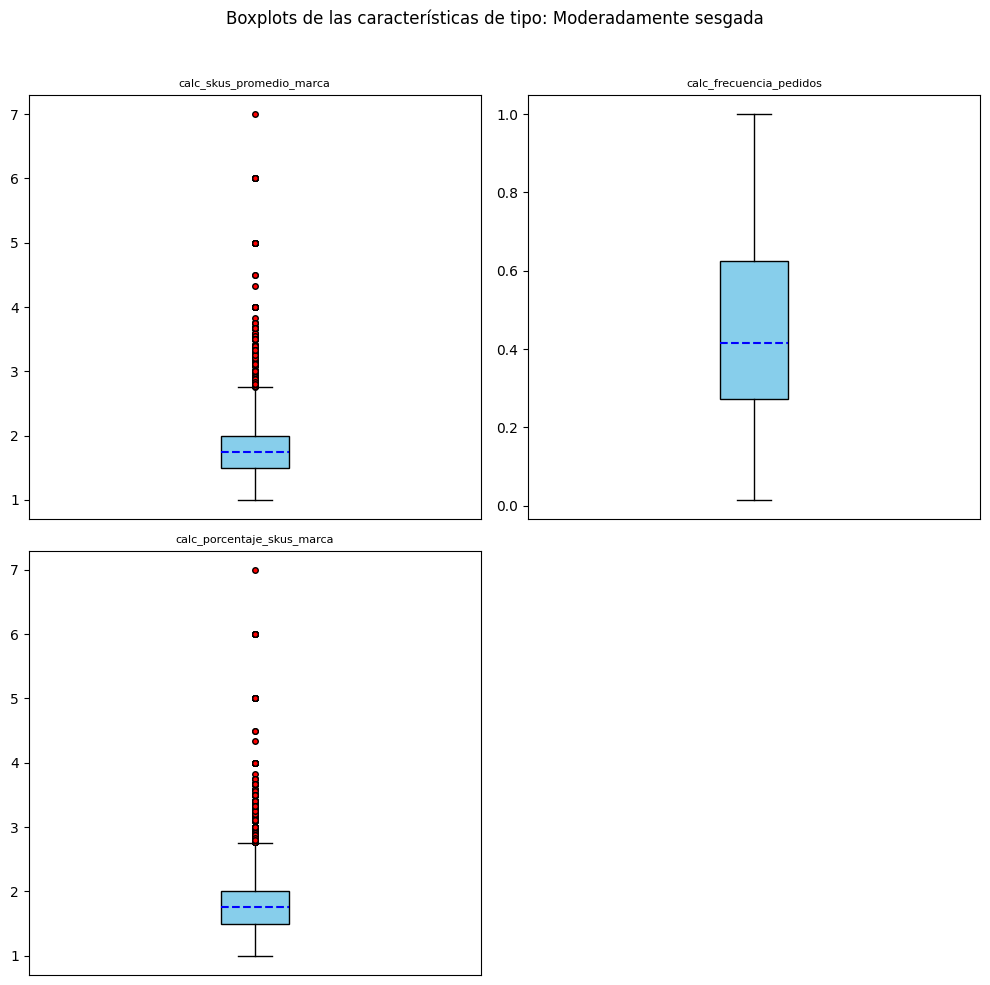

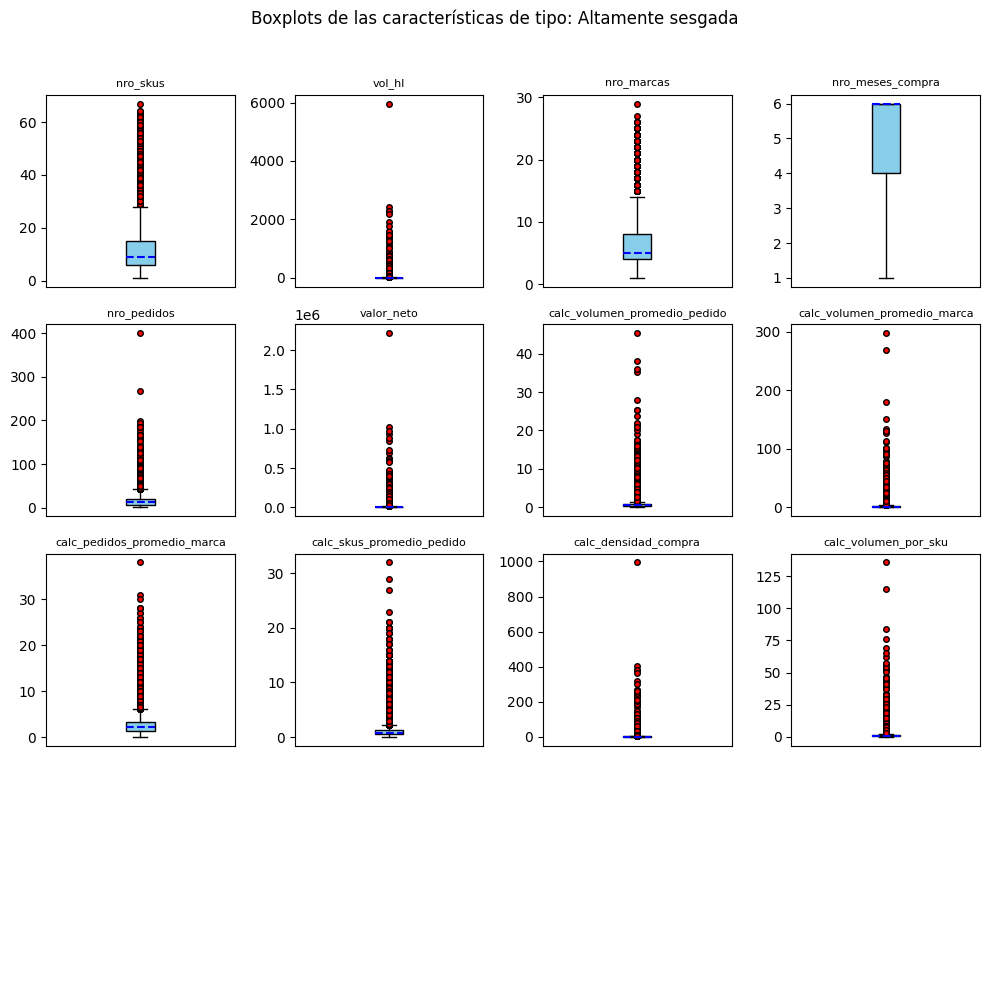

In [ ]:
for tipo in tipos_sesgos:
    plotear_boxplots(tipo)

Se observa que los boxplots de la categoría "Altamente Sesgada" presentan valores atípicos que se encuentran significativamente más alejados que los "outliers normales" o menos extremos. Aunque, por definición, los outliers son valores atípicos, no se eliminarán en este caso debido a su alta frecuencia. La presencia de un número significativo de estos valores sugiere que podrían formar su propio clúster o contener información valiosa sobre las instancias a las que pertenecen.

En lugar de eliminar las instancias completas correspondientes a estos puntos extremadamente atípicos, se realizará un tratamiento que consistirá en el rango intercuartílico.


In [ ]:
def tratar_outliers_iqr(train, columns):
    for column in columns:
        Q1 = train[column].quantile(0.25)
        Q3 = train[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Recortar los valores fuera de los límites
        train[column] = train[column].apply(lambda x: min(max(x, lower_bound), upper_bound))
    return train


In [ ]:
columns_aplicar = ['nro_skus', 'vol_hl', 'nro_marcas', 'nro_pedidos', 'valor_neto',
                    'calc_volumen_promedio_pedido', 'calc_volumen_promedio_marca', 'calc_pedidos_promedio_marca',
                    'calc_skus_promedio_pedido', 'calc_densidad_compra', 'calc_volumen_por_sku']

train = tratar_outliers_iqr(train, columns_aplicar)



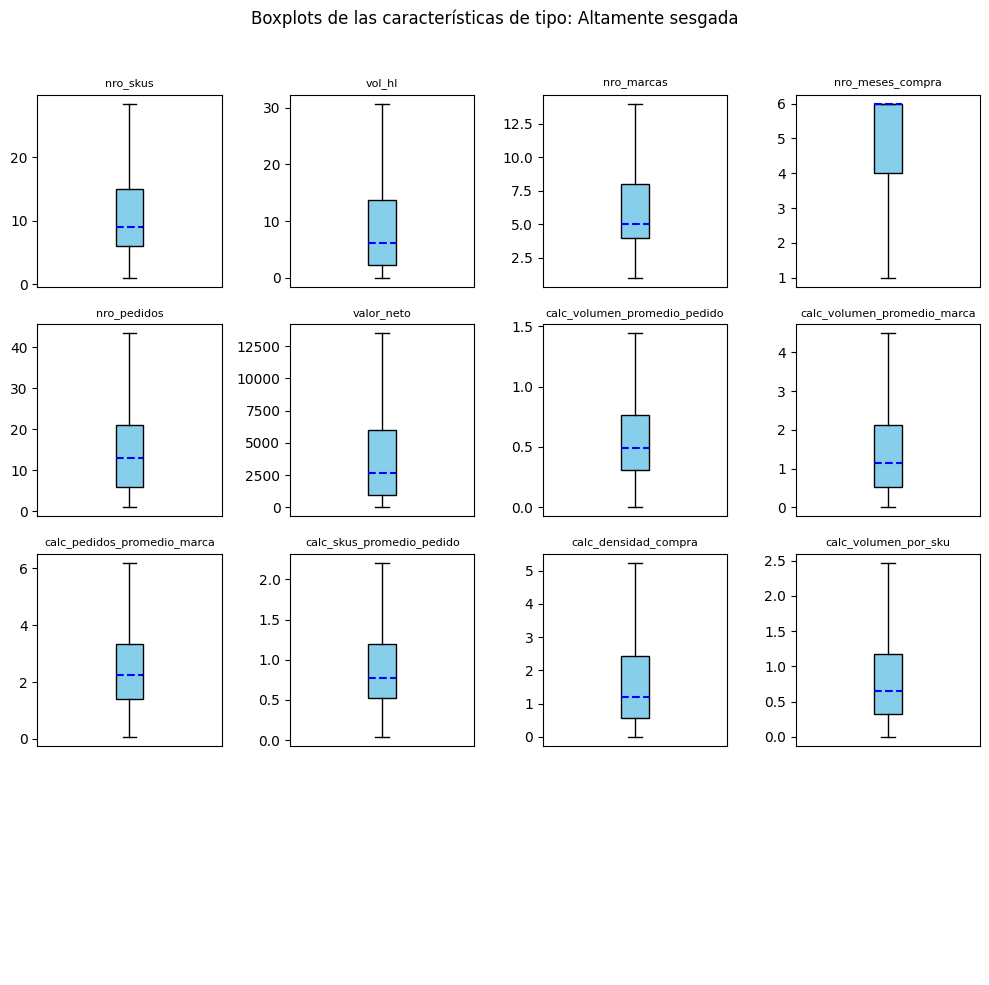

In [ ]:
plotear_boxplots(tipos_sesgos[2])

**Análisis de Correlaciones**

Como apoyo visual de características es interesante realizar un análisis bivariable. Se expondrá un pairplot de todo el conjunto (análisis bivariante completo). Además, de esta forma se puede visualizar la forma de la distribución de cada una de ellas por separado .

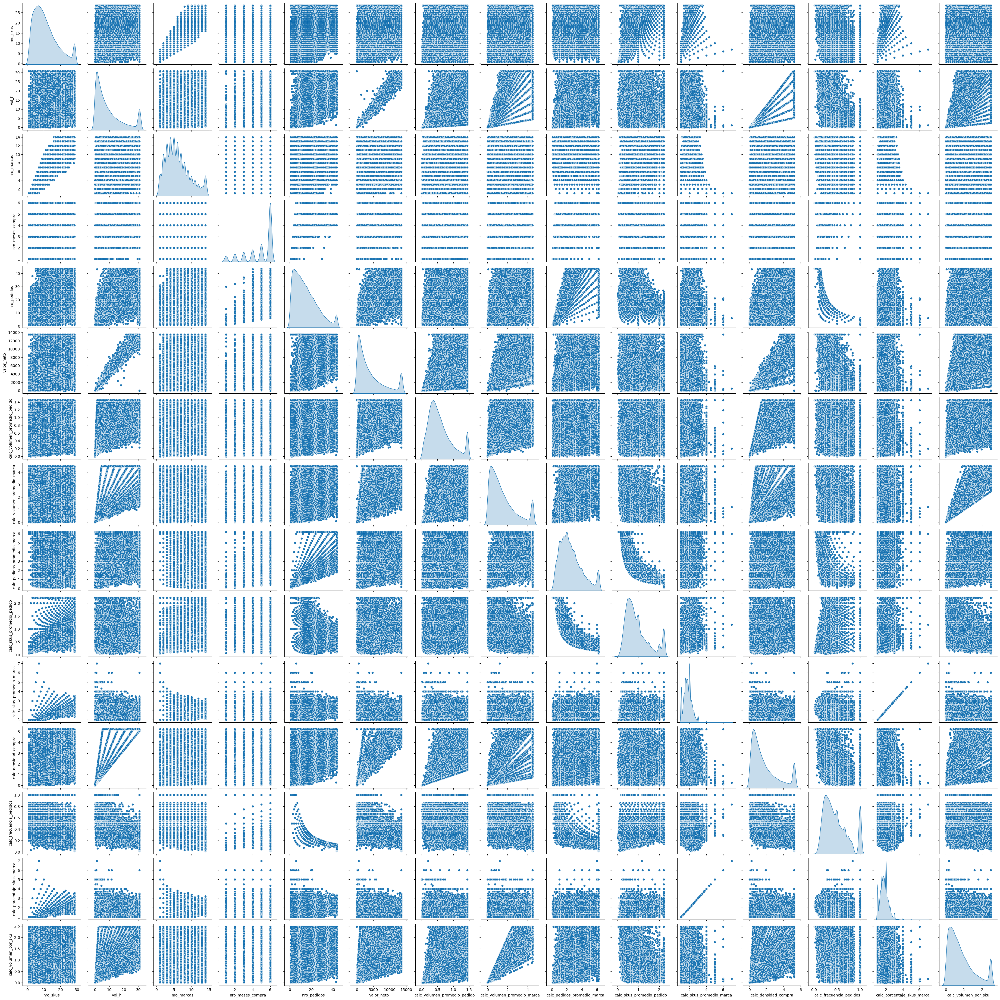

In [ ]:
sns.pairplot(train, diag_kind = 'kde')
plt.show()

Debido a la gran cantidad de características que componen este dataset, es dificil discernir las relaciones entre cada una de ellas y saber qué característica tiene relación con cual.

Sin embargo, sí que se pueden observar rápidamente ciertos pares que tienen un aspecto bastante lineal, mientras la mayoría son más dispersas.

Como primer acercamiento a este análisis bivariante, se va a desglosar este pairplot en grupos de características asociadas según de acuerdo con el conocimiento del dominio que se ha adquirido en la descripción de variables. Es decir, se va a agrupar por las variables originales y las variables calculadas a partir de ellas.

In [ ]:
train.columns

Index(['nro_skus', 'vol_hl', 'nro_marcas', 'nro_meses_compra', 'nro_pedidos',
       'valor_neto', 'calc_volumen_promedio_pedido',
       'calc_volumen_promedio_marca', 'calc_pedidos_promedio_marca',
       'calc_skus_promedio_pedido', 'calc_skus_promedio_marca',
       'calc_densidad_compra', 'calc_frecuencia_pedidos',
       'calc_porcentaje_skus_marca', 'calc_volumen_por_sku'],
      dtype='object')

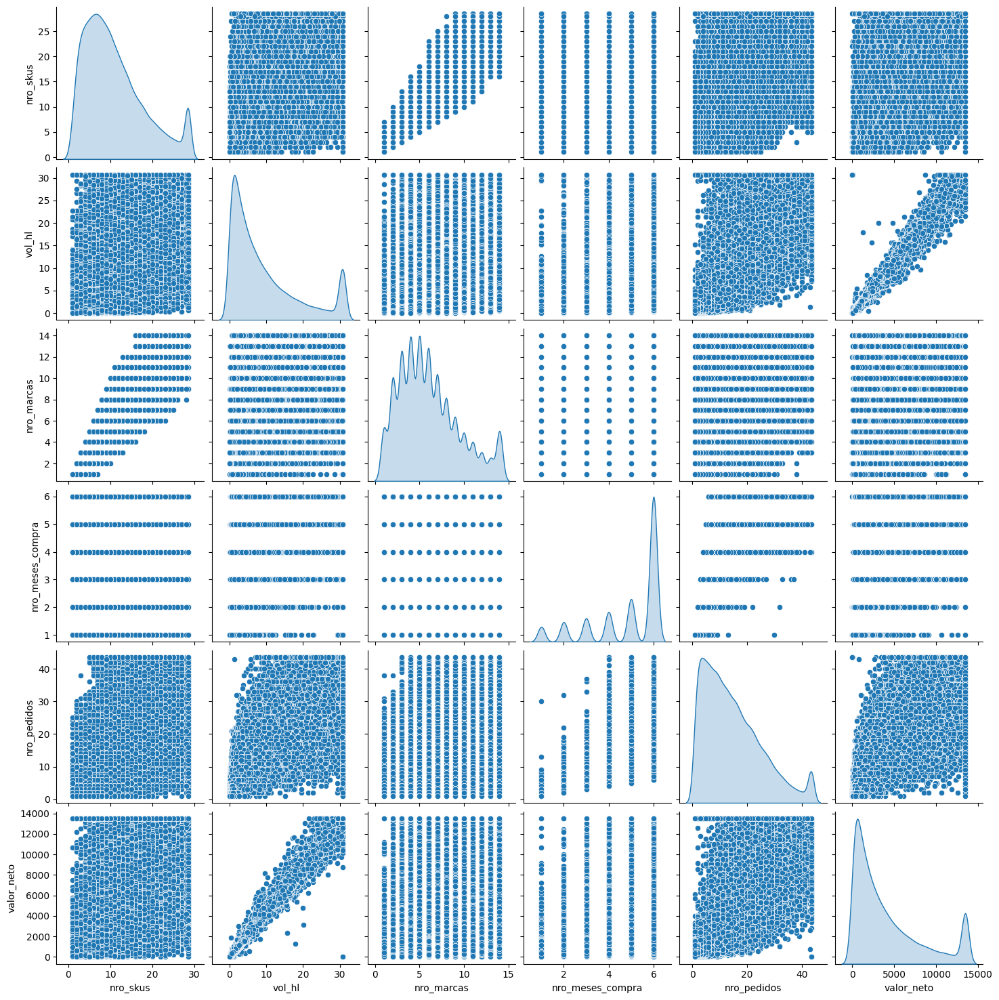

In [ ]:
sns.pairplot(train[['nro_skus', 'vol_hl', 'nro_marcas', 'nro_meses_compra', 'nro_pedidos',
       'valor_neto' ]], diag_kind = 'kde')
plt.show()

Existen algunas variables que están claramente correlacionadas, pero con cierta variabilidad también. Esto hace que sean unas variables interesantes seguramente a mantener.

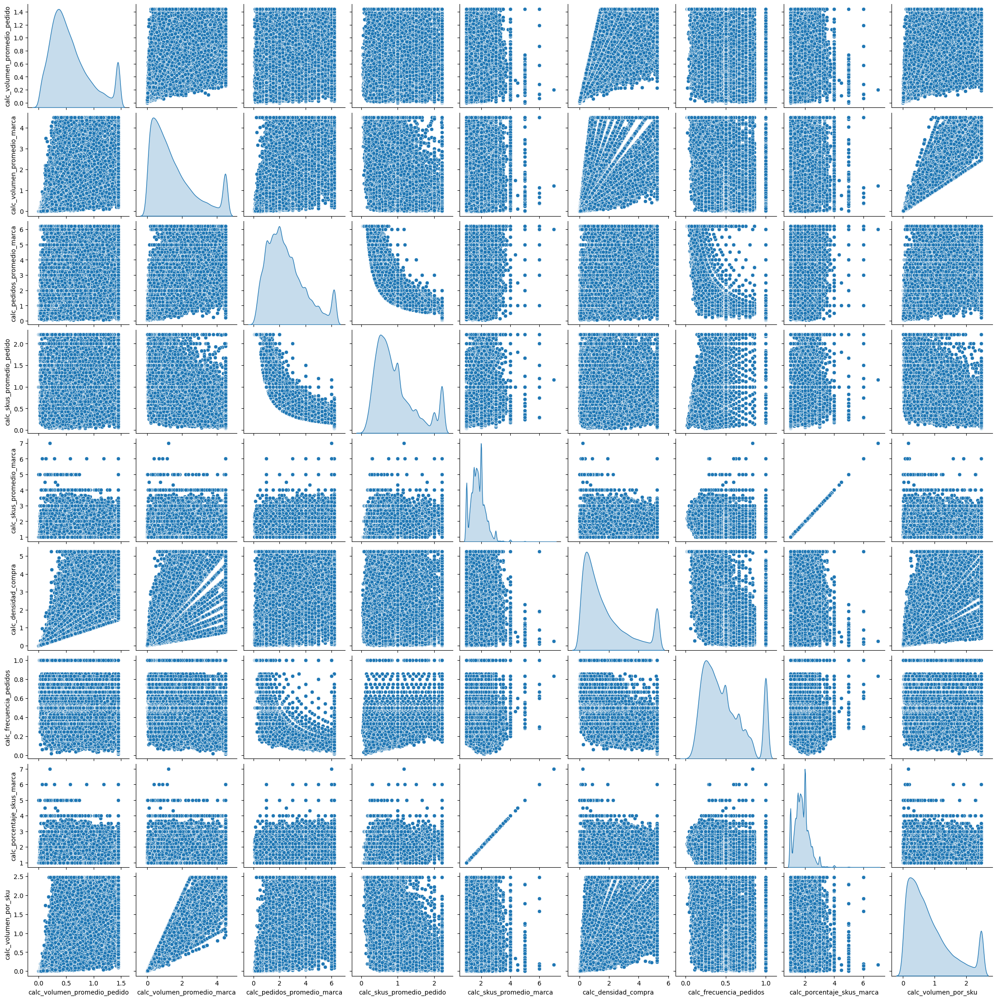

In [ ]:
sns.pairplot(train[['calc_volumen_promedio_pedido',
       'calc_volumen_promedio_marca', 'calc_pedidos_promedio_marca',
       'calc_skus_promedio_pedido', 'calc_skus_promedio_marca',
       'calc_densidad_compra', 'calc_frecuencia_pedidos',
       'calc_porcentaje_skus_marca', 'calc_volumen_por_sku']], diag_kind = 'kde')
plt.show()

Claramente se visualizan dos variables altamente correlacionadas:

*   *calc_porcentaje_skus_marca con calc_skus_promedio_marca*




Ahora que se entiende mucho mejor qué es lo que representan las características mencionadas y como son las relaciones que existen entre los subgrupos de estas, se realizará un análisis de correlaciones para evitar **multicolinealidad**.

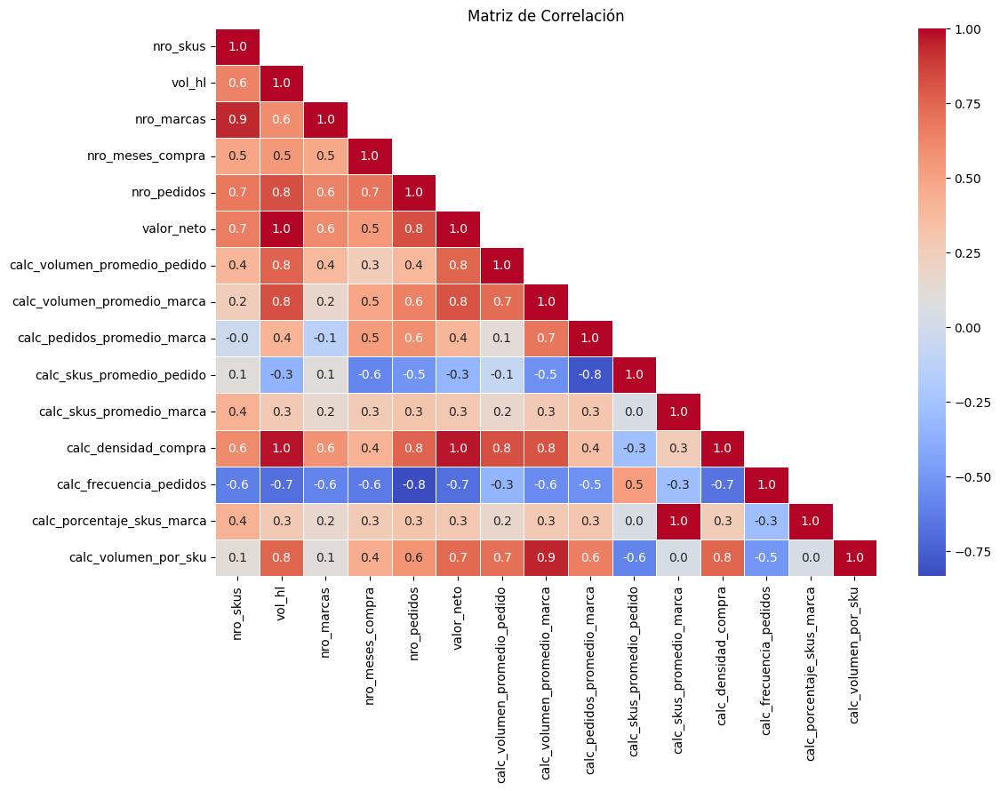

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


# Calcular la matriz de correlación
correlacion_matrix = train.corr()

# Establecer la parte inferior de la matriz en NaN
mask = np.triu(np.ones_like(correlacion_matrix, dtype=bool), k=1)  # k=1 para no incluir la diagonal

# Visualizar la matriz de correlación con un mapa de calor
plt.figure(figsize=(12, 8))  # Ajusta el tamaño del gráfico
sns.heatmap(correlacion_matrix, mask=mask, annot=True, fmt=".1f", cmap='coolwarm', linewidths=0.5)
plt.title("Matriz de Correlación")
plt.show()

Observaciones de la matriz de correlaciones:


*   Las variables *nro_marcas* y *nro_skus* presentan una correlación de 0.9. Sin embargo, ambas variables se mantendrán en el análisis porque representan aspectos distintos del comportamiento de compra. Mientras que nro_skus refleja la variedad de presentaciones total de productos adquiridos, nro_marcas indica la diversidad de marcas dentro de esa compra.


*   Las variables calc_volumen_por_sku y calc_volumen_promedio_marca presentan una correlación de 0.9.  Ambas variables se calculan a partir del volumen total (vol_hl) dividido entre el número de SKUs (nro_skus) o el número de marcas (nro_marcas) correspondientemente. Sin embargo, se elimina esta última variable. La elección de calc_volumen_por_sku se justifica porque el número de SKUs (nro_skus) suele ser una unidad de medida más granular y específica en comparación con el número de marcas (nro_marcas), lo que permite capturar mejor la variabilidad en la distribución del volumen.


*  Existen ciertas variables que tienen una correlación lineal absoluta (correlacion = 1). Sin lugar a duda, al menos una de cada característica de las correlacionadas debe eliminarse del dataset. De otra manera, se produciría la multicolinealidad y causaría la inestabilidad de los coeficientes, así como una reducción de la precisión. Estas son:

      - vol_hl y valor_neto. (se elimina esta última). Se mantiene vol_hl porque proporciona una medida más objetiva del tamaño de las transacciones, mientras que valor_neto puede estar influenciado por factores externos como descuentos o variaciones de precios.
      - vol_hl y calc_densidad_compra. (se elimina esta última). Dado que valor_neto ya se eliminó y vol_hl es suficiente para medir la cantidad comprada, calc_densidad_compra se vuelve redundante y se elimina para evitar colinealidad.
      - calc_densidad_compra y valor_neto. (estan 2 fueron eliminadas).
      - calc_porcentaje_skus_marca y calc_skus_promedio_marca (se elimina esta última). Al ser una media, puede suavizar las diferencias entre segmentos y reducir la capacidad de diferenciación del segmento.










Se procede a mostrar las relaciones entre las características mencionadas.

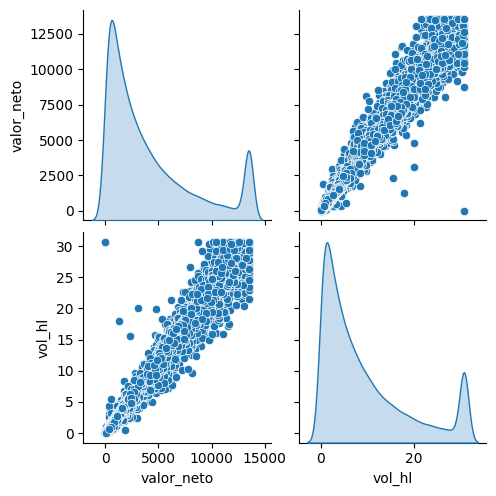

In [ ]:
sns.pairplot(train[['valor_neto', 'vol_hl']],
             diag_kind = 'kde')
plt.show()

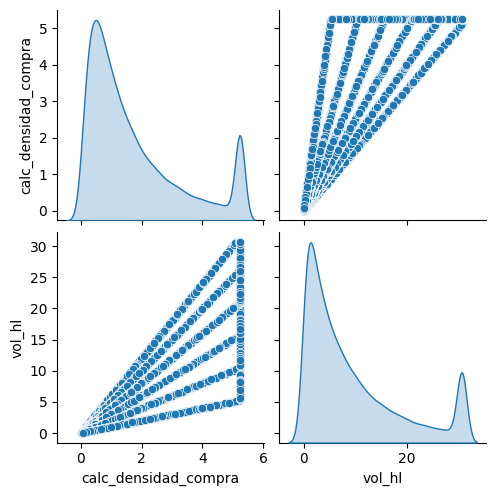

In [ ]:
sns.pairplot(train[['calc_densidad_compra',
                    'vol_hl']],
             diag_kind = 'kde')
plt.show()

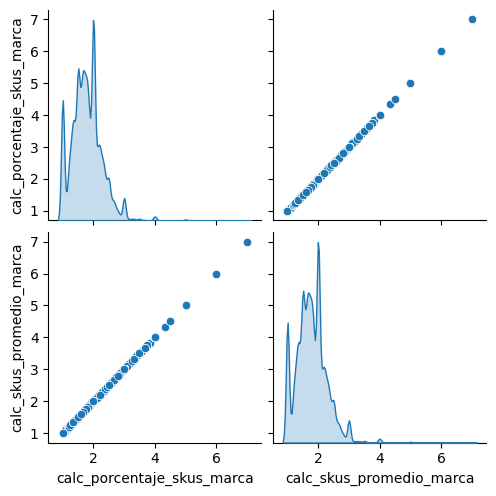

In [ ]:
sns.pairplot(train[['calc_porcentaje_skus_marca',
                    'calc_skus_promedio_marca']],
             diag_kind = 'kde')
plt.show()

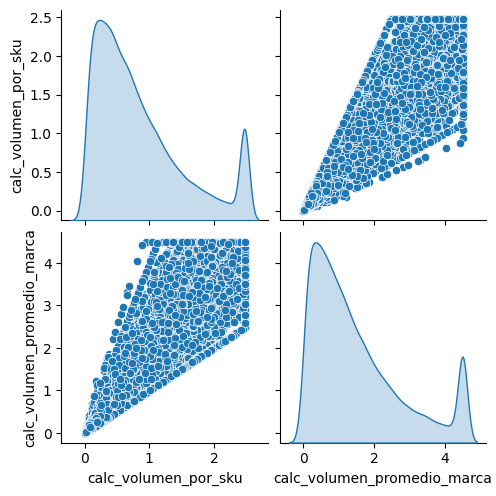

In [ ]:
sns.pairplot(train[['calc_volumen_por_sku',
                    'calc_volumen_promedio_marca']],
             diag_kind = 'kde')
plt.show()

In [ ]:
train.drop(['valor_neto', 'calc_densidad_compra','calc_skus_promedio_marca', 'calc_volumen_promedio_marca'], axis = 1, inplace = True)

---
# Relación Jerárquica de Características
---

Aunque ya se ha realizado una primera transformación del dataset en la exploración de datos (como el estudio de correlaciones y la eliminación de características), en este apartado se va a realizar una ingeniería de características un poco más avanzada, viendo posibles agrupaciones entre características similares.

Para ello, se va a usar uno de los algoritmos de clasificación no supervisada: la clasificación Jerárquica.

Para ello, como primer paso se transpondrá el dataset, para convertir las características a instancias y, como columnas, simplemente tendremos los índices (0, 1, 2...).

In [ ]:
train_transposed = train.T
train_transposed.head()

,0,1,2,3,4,5,6,7,8,9,...,82428,82429,82430,82431,82432,82433,82434,82435,82436,82437
nro_skus,11.000,10.000,6.000,28.500,28.000,6.000,28.500,27.000,28.500,10.000,...,11.000,5.000,8.000,5.000,11.000,8.000,14.00,5.00,6.000,8.000
vol_hl,2.029,4.972,8.349,30.725,29.607,2.181,30.725,30.725,30.725,10.366,...,0.268,0.244,0.302,0.095,0.151,4.001,0.99,0.08,2.683,0.662
nro_marcas,6.000,5.000,4.000,14.000,12.000,4.000,14.000,13.000,13.000,6.000,...,5.000,2.000,5.000,2.000,7.000,6.000,5.00,3.00,4.000,5.000
nro_meses_compra,4.000,6.000,5.000,6.000,6.000,3.000,6.000,6.000,6.000,6.000,...,1.000,1.000,1.000,1.000,1.000,1.000,1.00,1.00,1.000,1.000
nro_pedidos,7.000,10.000,11.000,34.000,17.000,6.000,43.000,29.000,38.000,13.000,...,1.000,1.000,1.000,1.000,1.000,1.000,1.00,1.00,1.000,1.000


Ahora, como índices tendremos las características.

In [ ]:
names = train_transposed.index
names

Index(['nro_skus', 'vol_hl', 'nro_marcas', 'nro_meses_compra', 'nro_pedidos',
       'calc_volumen_promedio_pedido', 'calc_pedidos_promedio_marca',
       'calc_skus_promedio_pedido', 'calc_frecuencia_pedidos',
       'calc_porcentaje_skus_marca', 'calc_volumen_por_sku'],
      dtype='object')

Como los algoritmos a usar están basado en el cálculo de distancias, primero se tendrán que normalizar los datos, de forma que todas las distancias sean relativas en una misma escala (entre 0 y 1).

**Normalización: MinMaxScaler**

In [ ]:
#http://scikit-learn.org/stable/modules/preprocessing.html
from sklearn.preprocessing import MinMaxScaler
min_max_scaler = MinMaxScaler()
features_norm = min_max_scaler.fit_transform(train_transposed)

**Matriz de similitud**

Como primer acercamiento al agrupamiento entre características usando métodos de clasificación, se usará la matriz de similitud. Esta matriz utiliza la distancia entre instancias (que en este nuevo dataset traspuesto, las instancias son las características) para agrupar según su cercanía.

Además de calcular las distancias,

In [ ]:
#http://docs.scipy.org/doc/scipy/reference/cluster.html
from scipy import cluster
from sklearn import metrics
dist = metrics.DistanceMetric.get_metric('euclidean')
matdist = dist.pairwise(features_norm)

Ahora tenemos una matriz cuadrada de la distancia entre las características. Para plotearla de forma que estas distancias queden normalizadas entre 0 y 1, se usará de nuevo el MinMaxScaler. Sin embargo, en esta ocasión, se realizará un cambio importante.

Esta función realiza un escalado por columna en un dataframe o numpy array. Sin embargo, para nuestra matriz de distancias, nos interesa que el escalado se haga de forma uniforme para toda la matriz sin tener en cuenta a la columna que pertenece el dato, ya que estamos realizando comparaciones de distancias generales.

Para ello, se "aplanará" (flatten()) la matriz cuadrada, se redimensionará de forma que todos los datos estén en una sola columna, y por último, se redimensionará de nuevo a la forma original.

In [ ]:
matdist_scaled = min_max_scaler.fit_transform(matdist.flatten().reshape(-1, 1))
matdist_scaled = matdist_scaled.reshape(matdist.shape[0], matdist.shape[1])

Ahora sí, se plotea el heatmap

In [ ]:
def plot_heatmap(df, labels, max = 1, min = -1):
  #Se genera una máscara por el triángulo superior
  mask = np.triu(np.ones_like(df, dtype=bool))

  #Se establece la figura de matplotlib
  f, ax = plt.subplots(figsize=(11, 11))

  #Se genera un mapa de color divergente
  cmap = sns.diverging_palette(230, 20, as_cmap=True)

  #Se plotea el mapa de calor con la máscara y un ratio correcto
  sns.heatmap(df, mask=mask, cmap=cmap, vmax=max, vmin = min, center=0,
              xticklabels = labels, yticklabels = labels,
              square=True, linewidths=.5, cbar_kws={"shrink": .5},
              annot = True, fmt=".2f", annot_kws = {"size": 8})
  plt.xticks(fontsize = 8)
  plt.yticks(fontsize = 8)

#Código adaptado de https://seaborn.pydata.org/examples/many_pairwise_correlations.html




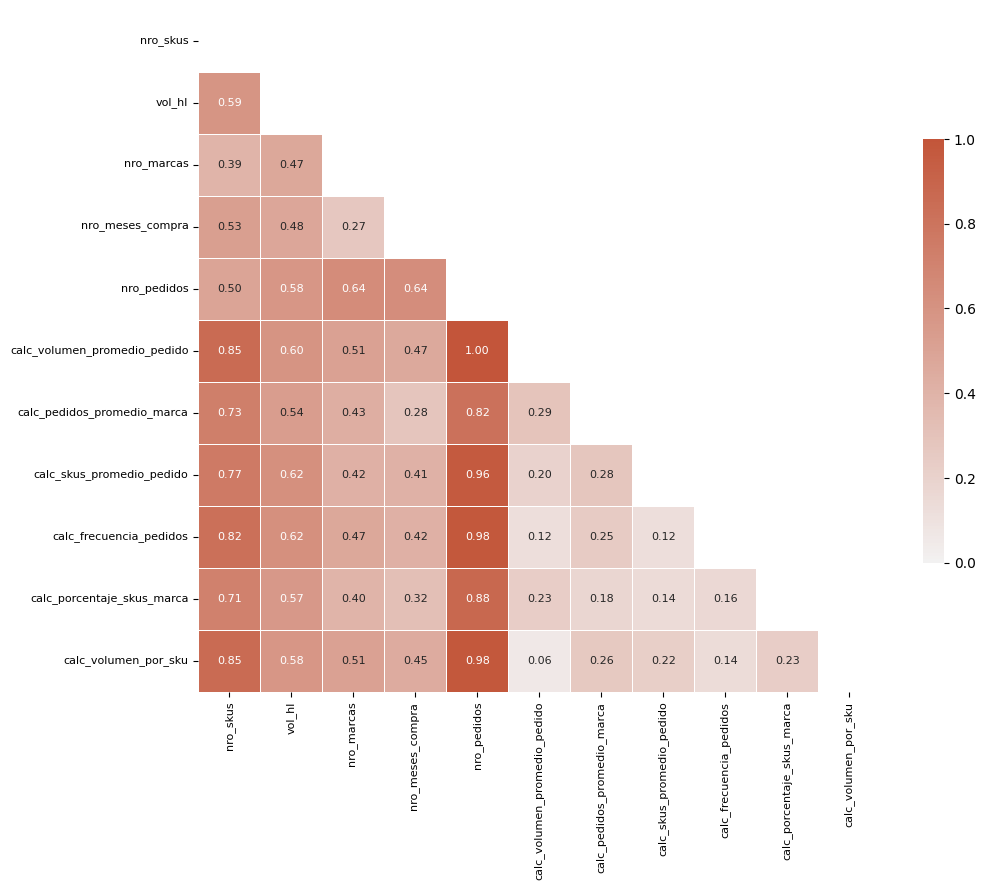

In [ ]:
#Se usa una función definida anteriormente para mantener formato en heatmaps
plot_heatmap(matdist_scaled, names, max = 1, min = 0)#Se usa una función definida anteriormente para mantener formato en heatmaps

**Selección de Características**

En la matriz de distancias, se espera identificar grupos de variables con valores bajos, lo que indica que capturan patrones similares y podrían formar clusters bien diferenciados. Por otro lado, valores altos sugieren que las variables son distintas entre sí y aportan información única.
Como se puede observar, existen muchas variables cuya distancia están cercanas a uno sin ser el cruce de dicha característica consigo misma.

Por lo tanto, esta matriz de similitud es una muy buena aproximación para visualizar los grupos de características que están muy cerca los unos de los otros en cuanto a distancia de valores se refieren.
Por ejemplo, las variables como calc_volumen_por_sku y calc_volumen_promedio_pedido están muy cerca entre sí, pero muy alejados del resto de características. Esto es un buen indicador de la presencia de un cluster bien diferenciado.


**Jerarquía mediante Linkage**

Otra manera de visualizar posibles formas de agrupar las características, es usando el algoritmo jerárquico.

La forma en la que funciona este algoritmo realizando sus cálculos será basándose en la matriz de similitud vista anteriormente. Sin embargo, esta jerarquización y unión de instancias (características en este caso) dependerá del método que se use en el algoritmo.

En primer lugar, se usará el método de cálculo de distancias single, que toma la mínima distancia de las instancias que forman un cluster al compararlo con otro cluster para formar nuevos clusteres mayores.

Además, se visualizará mediante un dendograma.

In [ ]:
from scipy import cluster

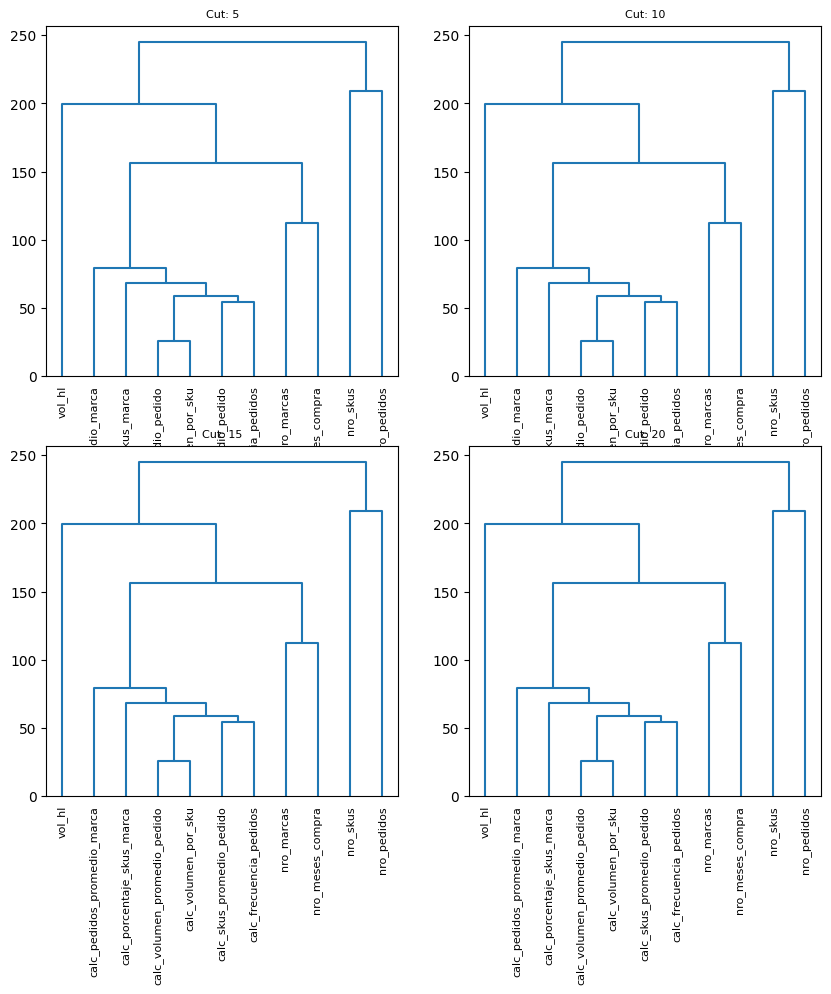

In [ ]:
# http://docs.scipy.org/doc/scipy/reference/generated/scipy.cluster.hierarchy.linkage.html#scipy.cluster.hierarchy.linkage
clusters = cluster.hierarchy.linkage(matdist, method = 'single')
# http://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.cluster.hierarchy.dendrogram.html
k = 2
fig, axs = plt.subplots(k, k, figsize = (10, 10))
#Utilizo el generador creado anteriormente para subplots cuadrados
incr_i_j = increment_index(k)
for cut in (5, 10, 15, 20):
  i, j = next(incr_i_j)
  cluster.hierarchy.dendrogram(clusters, color_threshold = cut, leaf_font_size = 8,
                                labels = names , leaf_rotation=90, ax = axs[i, j])
  axs[i, j].set_title(f'Cut: {cut}', fontsize = 8)
plt.show()

Se realizan varios cortes sobre los umbrales (5, 10, 15, 20), obteniendo similares agrupaciones. Estos cortes representan el valor de distancias a partir del cual se dejan de formar nuevos clústeres.

De forma generalizada, cuanto mayor es la distancia entre líneas horizontales, mayor es la distancia entre los nuevos clústeres y, por lo tanto, mejor sería la agrupación.

Desde mi perspectiva, la mejor agrupación define cuatro grupos, de los cuales tres corresponden a una única característica: volumen de hectolitros (vol_hl), número de SKUs (nro_skus) y número de pedidos (nro_pedidos). Estas variables se consideran outliers debido a su comportamiento distintivo dentro de la jerarquización.


Para visualizar esta agrupación en 2d, se va a hacer uso de una herramiento de reducción de dimensionalidad: Análisis de Componentes Principales (PCA).

**PCA (Principal Component Analysis)**

In [ ]:
from sklearn.decomposition import PCA
pca = PCA (n_components = 2)
X_pca = pca.fit_transform(features_norm)
print("Componentes lineales:\n", pca.components_)
print("\nRatio de variabilidad:", np.round(pca.explained_variance_ratio_, 3))

Componentes lineales:
 [[ 0.0032825   0.0044553   0.00369281 ...  0.001577    0.00174467
   0.0017213 ]
 [ 0.00439387  0.00149577 -0.00322944 ...  0.00737156  0.00496659
   0.00679928]]

Ratio de variabilidad: [0.748 0.132]


Como se puede observar, PCA ha realizado un buen trabajo, pues con tan solo dos componentes ha sido capaz de recoger  el 75% de la varianza de las características originales.

Se realiza un corte por el umbral definido

In [ ]:
cut = 10
labels = cluster.hierarchy.fcluster(clusters, cut , criterion = 'distance')
labels

array([10,  9,  7,  8, 11,  1,  6,  3,  4,  5,  2], dtype=int32)

Se plotea en 2D los puntos proyectados de la PCA.

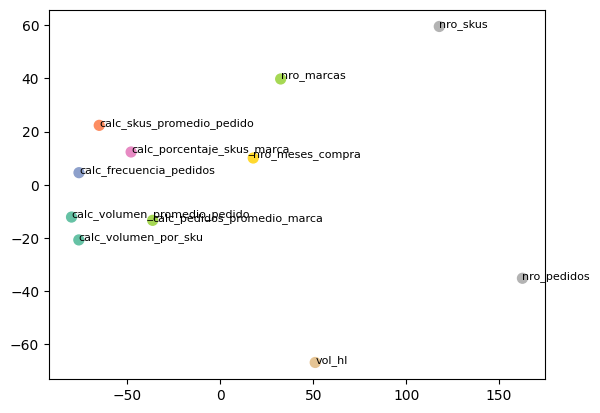

In [ ]:
plt.scatter(X_pca[:,0], X_pca[:,1], c=labels, s=50, cmap="Set2")
for i in range(len(X_pca)):
    plt.text(X_pca[i][0], X_pca[i][1], names[i], fontsize = 8)

plt.show()

Gracias a las proyecciones de PCA, es posible visualizar claramente los distintos clústeres generados mediante el algoritmo jerárquico. Además, estos clústeres muestran una coherencia visual notable, lo que refuerza su validez.

El gráfico de componentes principales (PCA) muestra que las variables pueden agruparse en distintos clústeres según su similitud, con algunas claramente relacionadas, como calc_volumen_promedio_pedido, calc_volumen_por_sku y calc_pedidos_promedio_marca. También se observa que variables como vol_hl, nro_pedidos y nro_skus están más alejadas, lo que indica que capturan información diferente.  Esta visualización confirma que la reducción de dimensionalidad preserva la estructura de los datos y que es posible identificar grupos de variables con patrones similares, facilitando el análisis y la interpretación.


**Clustering**

**K-MEANS**

In [ ]:
from sklearn.cluster import KMeans

De nuevo, se han de normalizar los datos, pues antes se normalizó el dataset traspuesto.

In [ ]:
train

,nro_skus,vol_hl,nro_marcas,nro_meses_compra,nro_pedidos,calc_volumen_promedio_pedido,calc_pedidos_promedio_marca,calc_skus_promedio_pedido,calc_frecuencia_pedidos,calc_porcentaje_skus_marca,calc_volumen_por_sku
0,11.0,2.029,6.0,4,7.0,0.289857,1.166667,1.571429,0.571429,1.833333,0.184455
1,10.0,4.972,5.0,6,10.0,0.497200,2.000000,1.000000,0.600000,2.000000,0.497200
2,6.0,8.349,4.0,5,11.0,0.759000,2.750000,0.545455,0.454545,1.500000,1.391500
3,28.5,30.725,14.0,6,34.0,1.274529,2.125000,1.088235,0.176471,2.312500,1.171189
4,28.0,29.607,12.0,6,17.0,1.443375,1.416667,1.647059,0.352941,2.333333,1.057393
...,...,...,...,...,...,...,...,...,...,...,...
82433,8.0,4.001,6.0,1,1.0,1.443375,0.166667,2.210526,1.000000,1.333333,0.500125
82434,14.0,0.990,5.0,1,1.0,0.990000,0.200000,2.210526,1.000000,2.800000,0.070714
82435,5.0,0.080,3.0,1,1.0,0.080000,0.333333,2.210526,1.000000,1.666667,0.016000
82436,6.0,2.683,4.0,1,1.0,1.443375,0.250000,2.210526,1.000000,1.500000,0.447167


In [ ]:
scaler = MinMaxScaler()
train_norm = scaler.fit_transform(train)

In [ ]:
pca = PCA(n_components=2)
data_pca = pca.fit_transform(train_norm)
data_pca

array([[-0.52000788,  0.27651332],
       [-0.16921891, -0.00962208],
       [ 0.03347917, -0.32756021],
       ...,
       [-1.26035518,  0.30223124],
       [-0.91290718,  0.42068407],
       [-1.08181658,  0.47521   ]])

Como, a priori, se desconoce el número de clusters de los que se debería de componer el dataset, se realizará un primer análisis variando la cantidad de clusteres y comparando dos indicadores de cuan bueno es dicho cluster:


*   Distorsión: se trata de la suma de las distancias cuadradas medidas desde los centroides de cada cluster a todos los puntos de su cluster. Se busca la menor distorsión posible sin excederse en el número de clusters. Como caso ideal de resultado de distorsión igual a cero, sería tantos clusteres como puntos haya. Sin embargo, esta clusterización no tienen ningún sentido, ya que no se habría agrupado absolutamente nada. Para alcanzar este equilibrio se hará uso del método no cientítico del codo, pero que da muy buenas aproximaciones experimentales.
*   Silueta: este indicador da una medida promedio de dos conceptos fundamentales en la medición de cuán bueno es un cluster formado.

  - Cohesión: cómo de cerca esta cada punto de un cluster con respecto al resto de puntos de ese mismo cluster.
  - Separación: cómo de lejos está cada punto de un cluster con respecto a cada punto de los ostros clústeres.
  
El valor de la Silueta puede variar desde -1 (punto categorizado erróneamente) hasta 1 (punto perfectamente agrupado). Los valores alrededor de 0 son puntos justo en la frontera entre clusteres. Como la silueta da valores promedios de este cálculo entre todos los puntos, valores a 0 se interpretan como superposición de clusteres (es decir, mala definición de los clusteres).

In [ ]:
distortions = []
silhouettes = []

for i in range(2, 20):
    km = KMeans(i, init='k-means++', n_init=10, random_state=42)
    clustering = km.fit_predict(train_norm)
    distortions.append(km.inertia_)
    silhouettes.append(metrics.silhouette_score(train_norm, clustering))

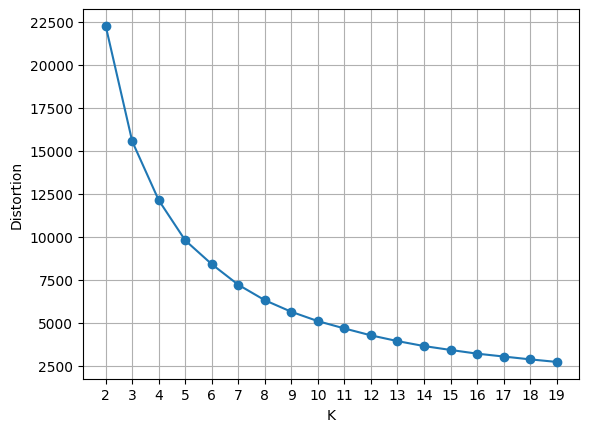

In [ ]:
plt.plot(range(2,20), distortions, marker='o')
plt.xticks(range(2, 20))
plt.xlabel('K')
plt.ylabel('Distortion')
plt.grid(True)
plt.show()

Como era de esperar, la distorsión disminuye a medida que se crean más clusteres. Como se ha comentado anteriormente, es difícil determinar un buen punto donde hay un balance entre número de clusters y baja distorsión. El método del codo nos dice que justo en el punto donde hay un cambio de pendiente, se encuentra este balance.

Ojo, esto no es un cálculo 100% efectivo, solo orientativo. El problema es que al haber tantas dimensiones de caraceterísticas no es posible aplicar el sentido común para escoger este número de clústeres.

Por lo tanto, se usará este método auxiliar.

In [ ]:
!pip install kneed
import kneed

Elbow:  6


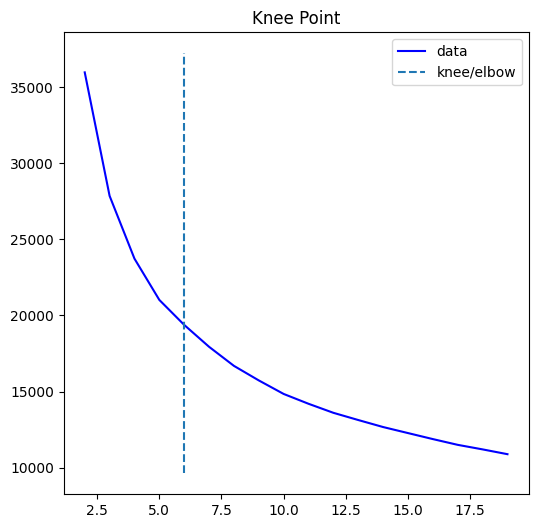

In [ ]:
kneedle = kneed.KneeLocator(range(2, 20), distortions[:20], curve="convex",
                            direction="decreasing")
elbow_point = kneedle.elbow
print('Elbow: ', elbow_point)
kneedle.plot_knee()

Según el método del codo, la mejor agrupación sería con 6 clústeres.

Ahora, se va a plotear los resultados del indicador de silueta.

In [ ]:
def plot_silhouettes(silhouettes, min, max, xLabel, step = 1):
  plt.plot(range(min, max, step), silhouettes , marker='o')
  plt.xticks(range(min, max, step))
  plt.xlabel(xLabel)
  plt.ylabel('Silhouette')
  plt.tick_params(axis = 'x', labelsize = 8)
  plt.grid(True)
  plt.show()
  print("Valores de silueta:")
  print([round(silhouette, 2) for silhouette in silhouettes])

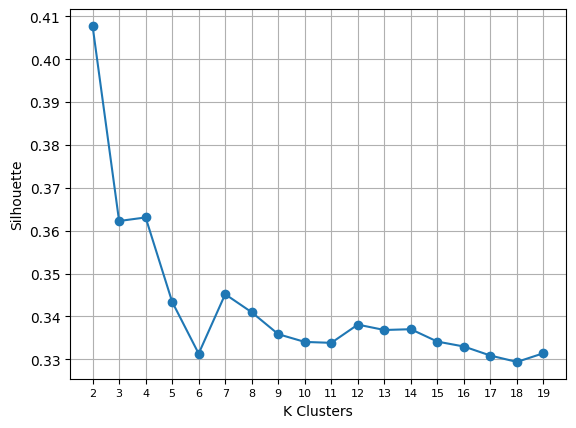

Valores de silueta:
[0.41, 0.36, 0.36, 0.34, 0.33, 0.35, 0.34, 0.34, 0.33, 0.33, 0.34, 0.34, 0.34, 0.33, 0.33, 0.33, 0.33, 0.33]


In [ ]:
plot_silhouettes(silhouettes, 2, 20, 'K Clusters')

Se obtiene una máxima silueta para un valor k = 2 clústeres.

Este resultado es contradictorio al del método del codo, que sugiere 6 clústeres.

Esto ocurre porque el método del codo no tiene en cuenta la separación de clústeres, tan solo la compactación en cada uno de ellos. Para el método del codo, cuantos más clústeres haya, más compactos estarán los datos intracluster, hasta que llega un momento (punto de inflexión) en el que la mejora ya no es significativa.

La silueta, en cambio, además de tener en cuenta la compactación o cohesión, también tiene en cuenta la clara separación entre clústeres.
Por lo tanto, se considera un mejor medidor de la calidad del modelo de clusterización.

Por otro lado, el mejor resultado obtenido con 2 clústeres es de 0.41. Este valor, cercano a 0.5, sugiere una moderada/buena agrupación. Es posible que un número significativo de puntos se encuentren en los límites de los clústeres, lo que reduce la puntuación de la silueta. Sin embargo, al no estar cerca de 0, el resultado no se considera deficiente.


No obstante, se va a visualizar cómo quedaría la agrupación con 2 y 6 clústeres respectivamente en 2d usando PCA.

Se define una función para usarse recurrentemente (por este y más modelos) para plotear los puntos de train_norm en 2D

Se calcula la clusterización de kmeans para 2 clústeres. Además, se plotean antes de llamar a la función antes definida.

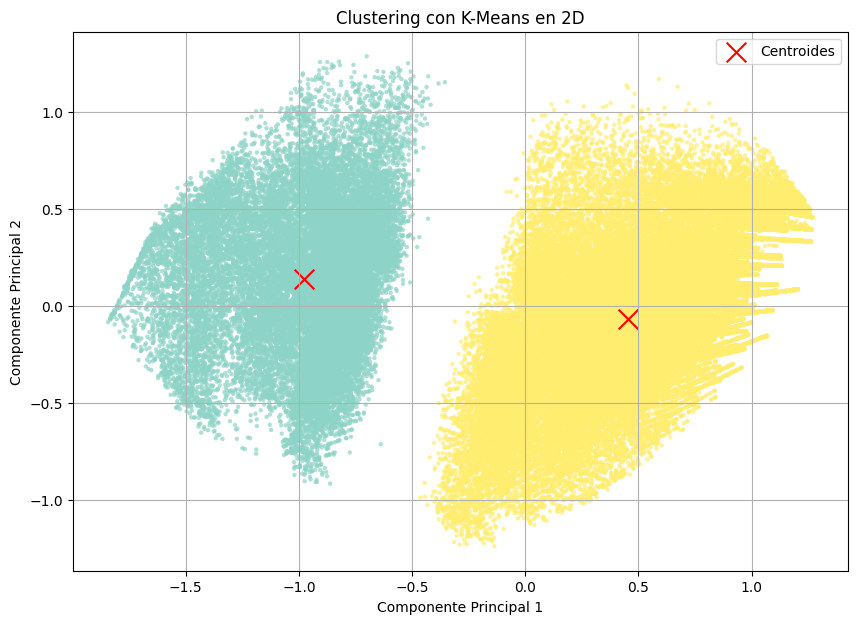

In [ ]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

def plot_train_norm_2D(X_pca, clustering, centroids_2d, algorithm_type, size=10):
    """
    Función para graficar los puntos de los clusters y los centroides en 2D.

    Parameters:
        X_pca: Datos en 2D obtenidos a través de PCA
        clustering: Etiquetas de clusters obtenidas del algoritmo
        centroids_2d: Coordenadas 2D de los centroides
        algorithm_type: Tipo de algoritmo de clustering (KMeans, DBSCAN, etc.)
        size: Tamaño de los puntos en el gráfico
    """
    plt.figure(figsize=(10, 7))
    # Graficar los puntos de los clusters
    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clustering, cmap="Set3", s=size, alpha=0.7, edgecolors='none', zorder=0)

    # Graficar los centroides
    plt.scatter(centroids_2d[:, 0], centroids_2d[:, 1], marker='x', s=200, c='red', label='Centroides', zorder=1)

    # Añadir título y etiquetas
    plt.title(f"Clustering con {algorithm_type} en 2D")
    plt.xlabel("Componente Principal 1")
    plt.ylabel("Componente Principal 2")
    plt.grid(True)

    # Mostrar la leyenda
    plt.legend()
    plt.show()

# Definir KMeans y PCA
km = KMeans(n_clusters=2, init='k-means++', n_init=10, random_state=42)

# Suponiendo que ya tienes la variable train_norm
scaler = MinMaxScaler()
train_norm = scaler.fit_transform(train)  # Normalización

# Reducir a 2 dimensiones con PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(train_norm)

# Ajustar el modelo de KMeans a los datos normalizados
clustering = km.fit_predict(train_norm)

# Obtener los centros de los clusters en el espacio PCA
centroids_2d = pca.transform(km.cluster_centers_)

# Llamar a la función de visualización
plot_train_norm_2D(X_pca, clustering, centroids_2d, 'K-Means')


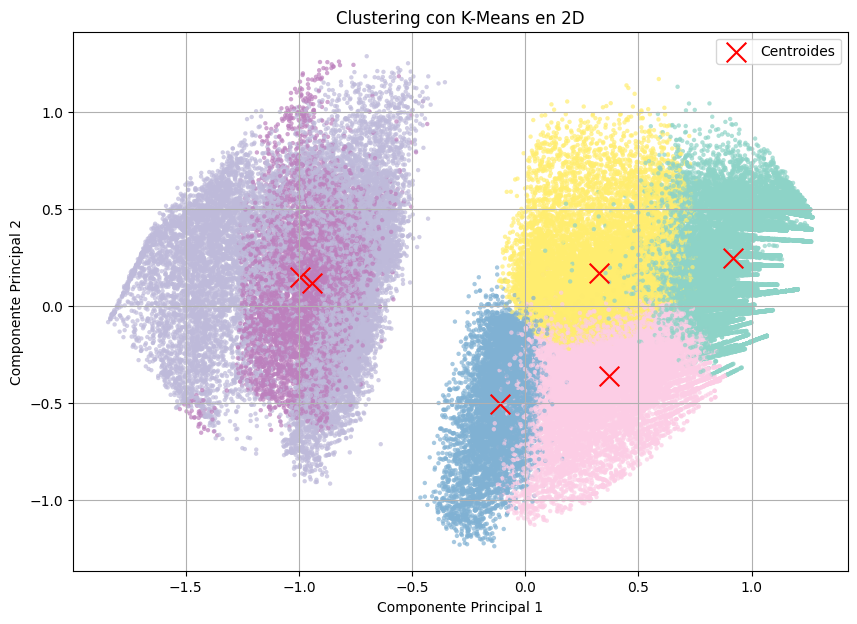

In [ ]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

def plot_train_norm_2D(X_pca, clustering, centroids_2d, algorithm_type, size=10):
    """
    Función para graficar los puntos de los clusters y los centroides en 2D.

    Parameters:
        X_pca: Datos en 2D obtenidos a través de PCA
        clustering: Etiquetas de clusters obtenidas del algoritmo
        centroids_2d: Coordenadas 2D de los centroides
        algorithm_type: Tipo de algoritmo de clustering (KMeans, DBSCAN, etc.)
        size: Tamaño de los puntos en el gráfico
    """
    plt.figure(figsize=(10, 7))
    # Graficar los puntos de los clusters
    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clustering, cmap="Set3", s=size, alpha=0.7, edgecolors='none', zorder=0)

    # Graficar los centroides
    plt.scatter(centroids_2d[:, 0], centroids_2d[:, 1], marker='x', s=200, c='red', label='Centroides', zorder=1)

    # Añadir título y etiquetas
    plt.title(f"Clustering con {algorithm_type} en 2D")
    plt.xlabel("Componente Principal 1")
    plt.ylabel("Componente Principal 2")
    plt.grid(True)

    # Mostrar la leyenda
    plt.legend()
    plt.show()

# Definir KMeans y PCA
km = KMeans(n_clusters=elbow_point, init='k-means++', n_init=10, random_state=42)

# Suponiendo que ya tienes la variable train_norm
scaler = MinMaxScaler()
train_norm = scaler.fit_transform(train)  # Normalización

# Reducir a 2 dimensiones con PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(train_norm)

# Ajustar el modelo de KMeans a los datos normalizados
clustering = km.fit_predict(train_norm)

# Obtener los centros de los clusters en el espacio PCA
centroids_2d = pca.transform(km.cluster_centers_)

# Llamar a la función de visualización
plot_train_norm_2D(X_pca, clustering, centroids_2d, 'K-Means')

Usando la visualización, parece que la subdivisión en 2 clústeres tiene mucho sentido. Sin embargo, no hay que olvidar que lo que se ve es una proyección de muchas dimensiones a 2 y esto hace que se dificulte enormemente el análisis visual.

Con base en los resultados obtenidos, el análisis de clustering sugiere que el número óptimo de clusters es 2, ya que presenta el mejor índice de silueta (0.41), lo que indica una segmentación más coherente y una mejor separación entre los grupos. Aunque la inercia disminuye al aumentar el número de clusters, el índice de silueta disminuye a medida que se agregan más segmentos, lo que sugiere que más clusters no mejoran la calidad del modelo. Por lo tanto, se recomienda utilizar 2 clusters para una segmentación más efectiva.

Se etiqueta el dataset y se guarda con sus índices originales (para poder cruzar datos a posteriori si es necesario, ya que se han borrado columnas y filas)

In [ ]:
pd.DataFrame(train_norm, columns = train.columns)

,nro_skus,vol_hl,nro_marcas,nro_meses_compra,nro_pedidos,calc_volumen_promedio_pedido,calc_pedidos_promedio_marca,calc_skus_promedio_pedido,calc_frecuencia_pedidos,calc_porcentaje_skus_marca,calc_volumen_por_sku
0,0.363636,0.066037,0.384615,0.6,0.141176,0.200819,0.178468,0.705556,0.564902,0.138889,0.074574
1,0.327273,0.161823,0.307692,1.0,0.211765,0.344470,0.314258,0.442289,0.593909,0.166667,0.201015
2,0.181818,0.271733,0.230769,0.8,0.235294,0.525851,0.436469,0.232872,0.446239,0.083333,0.562575
3,1.000000,1.000000,1.000000,1.0,0.776471,0.883020,0.334627,0.482941,0.163930,0.218750,0.473504
4,0.981818,0.963613,0.846154,1.0,0.376471,1.000000,0.219205,0.740401,0.343087,0.222222,0.427497
...,...,...,...,...,...,...,...,...,...,...,...
79928,0.254545,0.130220,0.384615,0.0,0.000000,1.000000,0.015519,1.000000,1.000000,0.055556,0.202197
79929,0.472727,0.032221,0.307692,0.0,0.000000,0.685892,0.020951,1.000000,1.000000,0.300000,0.028589
79930,0.145455,0.002604,0.153846,0.0,0.000000,0.055426,0.042677,1.000000,1.000000,0.111111,0.006469
79931,0.181818,0.087323,0.230769,0.0,0.000000,1.000000,0.029098,1.000000,1.000000,0.083333,0.180787


In [ ]:
train_norm = pd.DataFrame(train_norm, columns = train.columns)
train_norm['cluster'] = clustering
train_norm.to_csv('train_norm_clustered.csv', index = True)

In [ ]:
train_norm.head()

,nro_skus,vol_hl,nro_marcas,nro_meses_compra,nro_pedidos,calc_volumen_promedio_pedido,calc_pedidos_promedio_marca,calc_skus_promedio_pedido,calc_frecuencia_pedidos,calc_porcentaje_skus_marca,calc_volumen_por_sku,cluster_2,cluster_6,cluster
0,0.363636,0.066037,0.384615,0.6,0.141176,0.200819,0.178468,0.705556,0.564902,0.138889,0.074574,1.0,0.4,1
1,0.327273,0.161823,0.307692,1.0,0.211765,0.344470,0.314258,0.442289,0.593909,0.166667,0.201015,1.0,0.4,1
2,0.181818,0.271733,0.230769,0.8,0.235294,0.525851,0.436469,0.232872,0.446239,0.083333,0.562575,1.0,0.4,1
3,1.000000,1.000000,1.000000,1.0,0.776471,0.883020,0.334627,0.482941,0.163930,0.218750,0.473504,0.0,0.8,0
4,0.981818,0.963613,0.846154,1.0,0.376471,1.000000,0.219205,0.740401,0.343087,0.222222,0.427497,0.0,0.0,0


In [ ]:
# Trasladamos los resultados a la base original
train['cluster'] = train_norm['cluster']

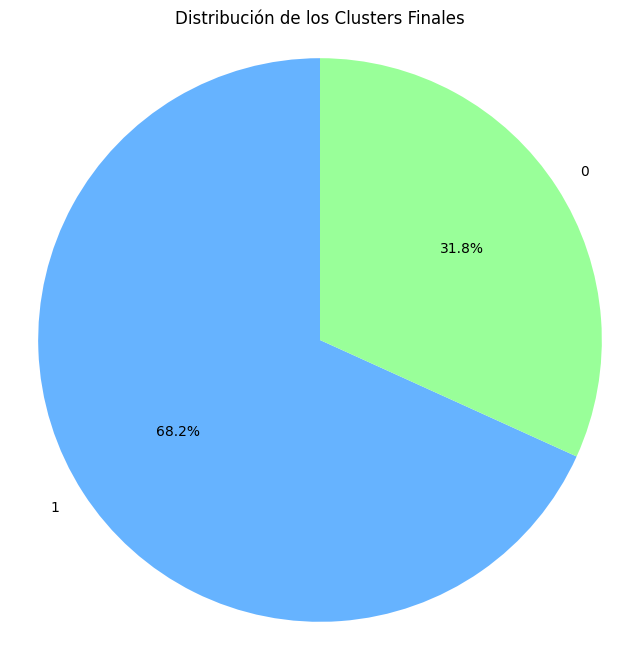

cluster_final
1    54529
0    25404
Name: count, dtype: int64


In [ ]:
import matplotlib.pyplot as plt

# Contar la cantidad de registros por cada cluster
cluster_counts = train['cluster_final'].value_counts()

# Crear un gráfico circular (pie chart) con los conteos absolutos
plt.figure(figsize=(8, 8))
plt.pie(cluster_counts, labels=cluster_counts.index, autopct='%1.1f%%', startangle=90, colors=["#66b3ff", "#99ff99"])

# Añadir título
plt.title('Distribución de los Clusters Finales')

# Mostrar el gráfico
plt.axis('equal')  # Asegura que el gráfico sea circular
plt.show()

# Si quieres ver los conteos absolutos, puedes imprimirlo
print(cluster_counts)


In [ ]:
# Contar el número de registros por cluster
cluster_counts = train['cluster_final'].value_counts()

# Mostrar el resultado
print(cluster_counts)

cluster_final
1    54529
0    25404
Name: count, dtype: int64


In [ ]:
# Guardar el DataFrame en un archivo CSV
train.to_csv('train_con_clusters.csv', index=False)

In [ ]:
train.head()

,nro_skus,vol_hl,nro_marcas,nro_meses_compra,nro_pedidos,calc_volumen_promedio_pedido,calc_pedidos_promedio_marca,calc_skus_promedio_pedido,calc_frecuencia_pedidos,calc_porcentaje_skus_marca,calc_volumen_por_sku,cluster,cluster_6,cluster_final
0,11.0,2.029,6.0,4,7.0,0.289857,1.166667,1.571429,0.571429,1.833333,0.184455,1.0,0.4,1
1,10.0,4.972,5.0,6,10.0,0.497200,2.000000,1.000000,0.600000,2.000000,0.497200,1.0,0.4,1
2,6.0,8.349,4.0,5,11.0,0.759000,2.750000,0.545455,0.454545,1.500000,1.391500,1.0,0.4,1
3,28.5,30.725,14.0,6,34.0,1.274529,2.125000,1.088235,0.176471,2.312500,1.171189,0.0,0.8,0
4,28.0,29.607,12.0,6,17.0,1.443375,1.416667,1.647059,0.352941,2.333333,1.057393,0.0,0.0,0


**Interpretación**

Lo primero que necesitamos es agrupar tu base de datos por el campo de cluster y calcular las medias de las variables de interés para cada cluster. Esto te dará un resumen de las características de los clientes en cada grupo.



In [ ]:
# Agrupar por cluster y calcular las medias de las variables
cluster_summary = train.groupby('cluster_final').mean()

# Mostrar el resumen
print(cluster_summary)


                nro_skus     vol_hl  nro_marcas  nro_meses_compra  \
cluster_final                                                       
0              17.724610  20.202282    9.086404          5.893639   
1               7.861551   4.345317    4.669387          4.307891   

               nro_pedidos  calc_volumen_promedio_pedido  \
cluster_final                                              
0                27.039698                      0.832358   
1                 9.074676                      0.461249   

               calc_pedidos_promedio_marca  calc_skus_promedio_pedido  \
cluster_final                                                           
0                                 3.275851                   0.713516   
1                                 2.178477                   1.040172   

               calc_frecuencia_pedidos  calc_porcentaje_skus_marca  \
cluster_final                                                        
0                             0.235236           

In [ ]:
# Resumen de los clusters proporcionado
cluster_1 = cluster_summary.loc[0]  # Suponiendo que el cluster 1 tiene índice 0
cluster_2 = cluster_summary.loc[1]  # Suponiendo que el cluster 2 tiene índice 1

# Interpretación de los clusters con sus características y etiquetas
print(f"Cluster 0: Los clientes en este cluster tienen un promedio de {cluster_1['nro_skus']:.2f} SKUs, un volumen de {cluster_1['vol_hl']:.2f} HL, "
      f"compran aproximadamente {cluster_1['nro_marcas']:.2f} marcas, y tienen un promedio de {cluster_1['nro_pedidos']:.2f} pedidos. "
      f"Además, tienen un promedio de {cluster_1['calc_volumen_promedio_pedido']:.2f} volumen por pedido, "
      f"y {cluster_1['calc_pedidos_promedio_marca']:.2f} pedidos por marca. "
      f"En este grupo se identificaron {len(train[train['cluster_final'] == 0])} clientes. "
      f"Este cluster podría ser definido como 'Clientes de Alto Potencial', ya que, aunque tienen un buen volumen de compras por pedido y una cantidad considerable de pedidos, "
      f"su frecuencia de compras no es tan alta como la de otros grupos. Esto sugiere que estos clientes tienen una gran oportunidad de crecer en términos de volumen y frecuencia de compra.")

print(f"Cluster 1: Los clientes en este cluster tienen un promedio de {cluster_2['nro_skus']:.2f} SKUs, un volumen de {cluster_2['vol_hl']:.2f} HL, "
      f"compran aproximadamente {cluster_2['nro_marcas']:.2f} marcas, y tienen un promedio de {cluster_2['nro_pedidos']:.2f} pedidos. "
      f"Además, tienen un promedio de {cluster_2['calc_volumen_promedio_pedido']:.2f} volumen por pedido, "
      f"y {cluster_2['calc_pedidos_promedio_marca']:.2f} pedidos por marca. "
      f"En este grupo se identificaron {len(train[train['cluster_final'] == 1])} clientes. "
      f"Este cluster podría ser definido como 'Clientes Estables', ya que muestran un comportamiento de compra consistente, "
      f"con una frecuencia de compras regular, pero de menor volumen por pedido. Son clientes que probablemente están comprometidos con las marcas, "
      f"pero no requieren incentivos grandes para continuar comprando de manera constante.")



Cluster 0: Los clientes en este cluster tienen un promedio de 17.72 SKUs, un volumen de 20.20 HL, compran aproximadamente 9.09 marcas, y tienen un promedio de 27.04 pedidos. Además, tienen un promedio de 0.83 volumen por pedido, y 3.28 pedidos por marca. En este grupo se identificaron 25404 clientes. Este cluster podría ser definido como 'Clientes de Alto Potencial', ya que, aunque tienen un buen volumen de compras por pedido y una cantidad considerable de pedidos, su frecuencia de compras no es tan alta como la de otros grupos. Esto sugiere que estos clientes tienen una gran oportunidad de crecer en términos de volumen y frecuencia de compra.
Cluster 1: Los clientes en este cluster tienen un promedio de 7.86 SKUs, un volumen de 4.35 HL, compran aproximadamente 4.67 marcas, y tienen un promedio de 9.07 pedidos. Además, tienen un promedio de 0.46 volumen por pedido, y 2.18 pedidos por marca. En este grupo se identificaron 54529 clientes. Este cluster podría ser definido como 'Clientes E

**Mapa de calor para interpretar los Clúster**

In [ ]:
df_cluster = train.groupby("cluster_final").mean()

In [ ]:
df_normalizado = (df_cluster - df_cluster.min()) / (df_cluster.max() - df_cluster.min())

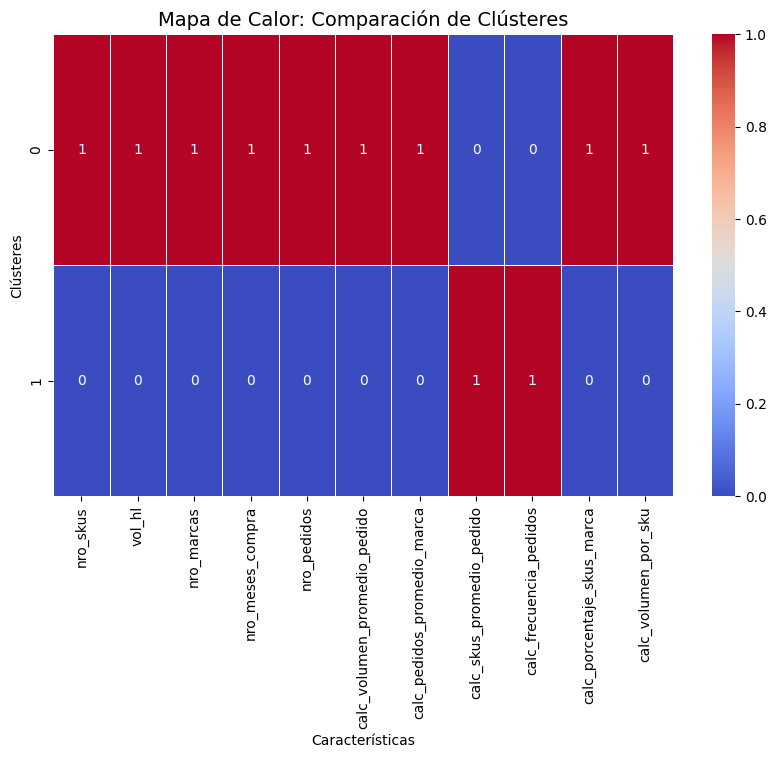

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.heatmap(df_normalizado, annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Mapa de Calor: Comparación de Clústeres", fontsize=14)
plt.xlabel("Características")
plt.ylabel("Clústeres")
#plt.xticks(rotation=45)
plt.show()

El Clúster 0, tiene valores altos (1) en la mayoría de las características, lo que sugiere que sus clientes tienen un mayor número de compras, SKUs, volumen de compra, etc. Es decir que este clúster representa clientes más activos.

El Clúster 1, tiene valores bajos (0) en la mayoría de las características, lo que indica que estos clientes compran con menos frecuencia, menor volumen y variedad. Es decir que este clúster representa clientes menos activos.
